<div style="color:white;display:fill;border-radius:8px;
            background-color:#CCFF00;font-size:150%;
            letter-spacing:1.0px">
    <p style="padding: 8px;color:white;"><b><b><span style='color:#1562C1'> Customer churn prediction: Telecom Churn</span></b></b></p>
</div>



<center>
    <img src="https://miro.medium.com/v2/resize:fit:1358/0*8Iu_eymr6eR-YuQw" alt="Custumor churn prediction" width="50%">
</center>



**Importing necessary Libraries**

In [116]:
import numpy as np
import pandas as pd
from math import*
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
import itertools
import io
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings('ignore')
import os
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objs as go
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from yellowbrick.classifier import DiscriminationThreshold
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn import tree
from graphviz import Source
from IPython.display import SVG, display
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
import seaborn as sns
from math import ceil
from sklearn.metrics import roc_curve, auc

%matplotlib inline


In [54]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/telecom-churn-datasets/churn-bigml-20.csv
/kaggle/input/telecom-churn-datasets/churn-bigml-80.csv


# 1. Data Overview

In [55]:
telecom_train=pd.read_csv("/kaggle/input/telecom-churn-datasets/churn-bigml-80.csv")
telecom_test=pd.read_csv("/kaggle/input/telecom-churn-datasets/churn-bigml-20.csv")


In [56]:
telecom_train.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [57]:
def data_overview(df, message):
    print(f"{message}:\n")
    
    # General overview
    print(f"Number of rows: {df.shape[0]}")
    print(f"Number of columns: {df.shape[1]}")
    
    # List of features
    print("\nList of columns/features:")
    for column in df.columns:
        print(f" - {column}")
    
    # Missing values
    total_missing = df.isnull().sum().sum()
    print(f"\nTotal missing values: {total_missing}")
    
    # Unique values per feature
    print("\nUnique values per feature:")
    unique_values = df.nunique()
    for column, unique in unique_values.items():
        print(f" - {column}: {unique}")

In [58]:
data_overview(telecom_train, "Telecom Train Data Overview")
data_overview(telecom_test, "Telecom Test Data Overview")


Telecom Train Data Overview:

Number of rows: 2666
Number of columns: 20

List of columns/features:
 - State
 - Account length
 - Area code
 - International plan
 - Voice mail plan
 - Number vmail messages
 - Total day minutes
 - Total day calls
 - Total day charge
 - Total eve minutes
 - Total eve calls
 - Total eve charge
 - Total night minutes
 - Total night calls
 - Total night charge
 - Total intl minutes
 - Total intl calls
 - Total intl charge
 - Customer service calls
 - Churn

Total missing values: 0

Unique values per feature:
 - State: 51
 - Account length: 205
 - Area code: 3
 - International plan: 2
 - Voice mail plan: 2
 - Number vmail messages: 42
 - Total day minutes: 1489
 - Total day calls: 115
 - Total day charge: 1489
 - Total eve minutes: 1442
 - Total eve calls: 120
 - Total eve charge: 1301
 - Total night minutes: 1444
 - Total night calls: 118
 - Total night charge: 885
 - Total intl minutes: 158
 - Total intl calls: 21
 - Total intl charge: 158
 - Customer serv

# 2. Exploratory Data Analysis

**2.1 Customer churn in Data**

In [59]:
def plot_churn_pie_chart(df, title="Customer churn in training data"):
    churn_counts = df["Churn"].value_counts()
    
    trace = go.Pie(labels=churn_counts.keys().tolist(),
                   values=churn_counts.values.tolist(),
                   marker=dict(colors=['royalblue', 'lime'],
                               line=dict(color="white", width=1.3)),
                   hole=0.5,
                   rotation=90,
                   hoverinfo="label+value+percent")
    
    layout = go.Layout(title=title,
                       plot_bgcolor="rgb(243,243,243)",
                       paper_bgcolor="rgb(243,243,243)")
    
    fig = go.Figure(data=[trace], layout=layout)
    py.iplot(fig)

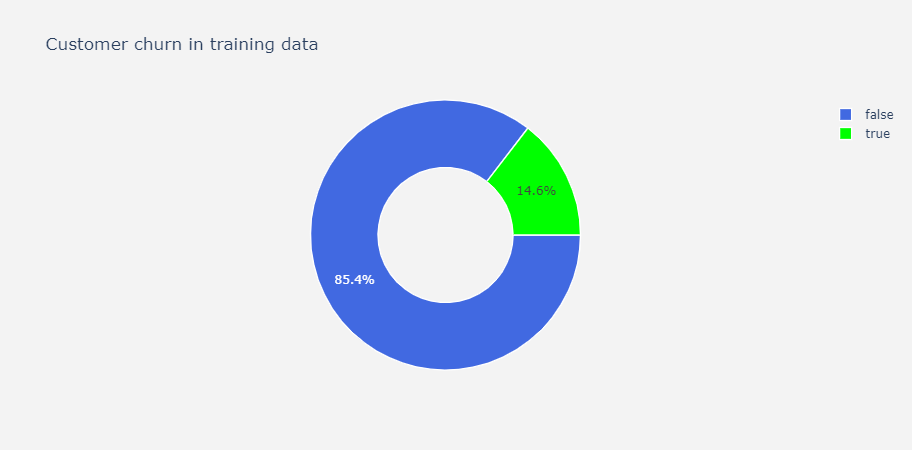

In [60]:
plot_churn_pie_chart(telecom_train)

**2.2 Variable Distributions**

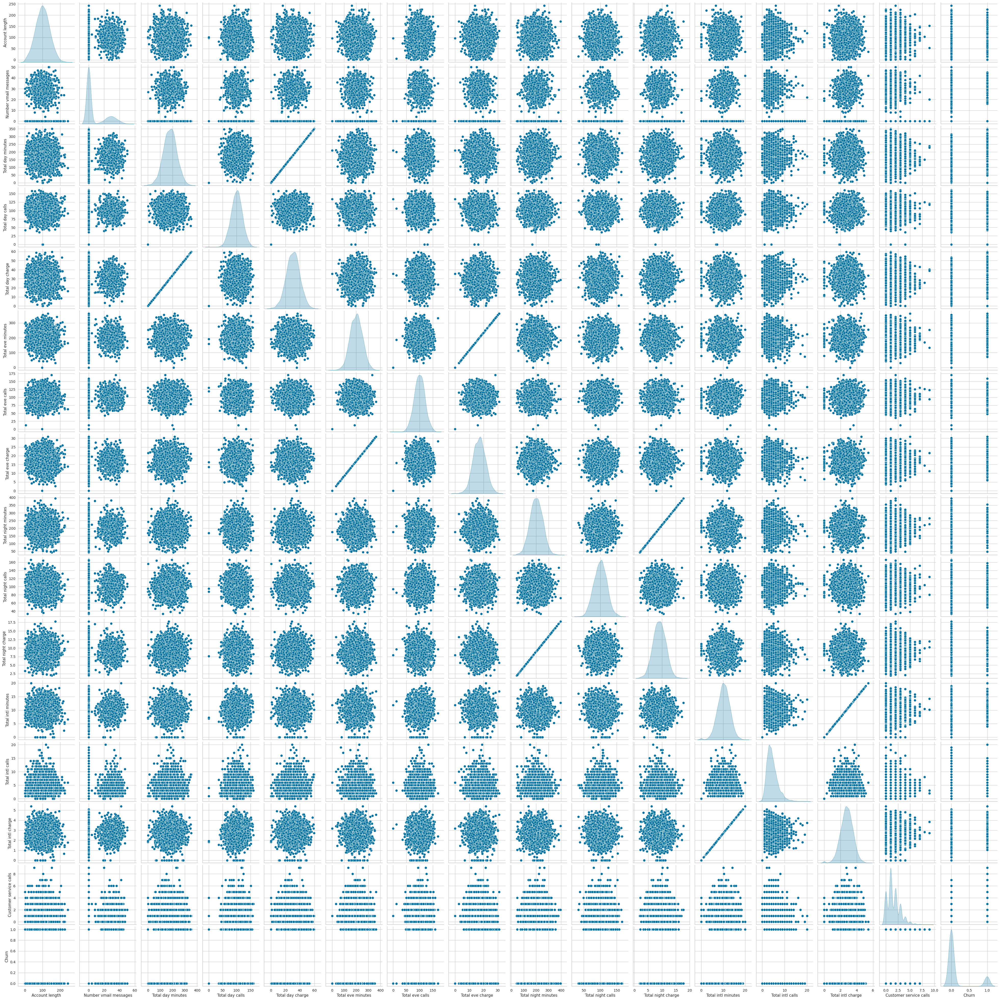

In [61]:
out_cols = telecom_train.columns[telecom_train.nunique() < 6].tolist() + telecom_train.select_dtypes(include='object').columns.tolist()

# Removing duplicates from out_cols
out_cols = list(set(out_cols))

# viz_cols will contain columns not in out_cols plus 'Churn'
viz_cols = [col for col in telecom_train.columns if col not in out_cols] + ['Churn']

# Pairplot with specified columns
sns.pairplot(telecom_train[viz_cols], diag_kind="kde")
plt.show()

--->When numerical data are highly correlated, it means that one variable can be linearly predicted from the other with a significant degree of accuracy. This high correlation indicates redundancy, meaning both variables provide similar information about the dataset. Including both correlated variables in a model can lead to issues such as multicollinearity, which can adversely affect the model's performance and interpretability.

# 3. Data Preprocessing

In [62]:
#Removing Correlated and Unnecessary Columns
# Columns to drop
col_to_drop = ['State', 'Area code', 'Total day charge', 'Total eve charge', 
               'Total night charge', 'Total intl charge']

# Dropping columns from both training and testing datasets
telcom = telecom_train.drop(columns=col_to_drop, axis=1)
telcom_test = telecom_test.drop(columns=col_to_drop, axis=1)

In [63]:
#Defining Target and Feature Columns
# Target column
target_col = ["Churn"]

# Number of levels to consider a feature as categorical
nlevels = 6


In [64]:
#Separating Categorical and Numerical Columns
# Identifying categorical columns
cat_cols = list(set(telcom.nunique()[telcom.nunique() < nlevels].keys().tolist() 
                    + telcom.select_dtypes(include='object').columns.tolist()))
cat_cols = [x for x in cat_cols if x not in target_col]

# Identifying numerical columns
num_cols = [x for x in telcom.columns if x not in cat_cols + target_col]

# Binary columns with 2 unique values
bin_cols = telcom.nunique()[telcom.nunique() == 2].keys().tolist()

# Columns with more than 2 unique values
multi_cols = [i for i in cat_cols if i not in bin_cols]


In [65]:
cat_cols, num_cols

(['International plan', 'Voice mail plan'],
 ['Account length',
  'Number vmail messages',
  'Total day minutes',
  'Total day calls',
  'Total eve minutes',
  'Total eve calls',
  'Total night minutes',
  'Total night calls',
  'Total intl minutes',
  'Total intl calls',
  'Customer service calls'])

In [66]:
bin_cols,multi_cols

(['International plan', 'Voice mail plan', 'Churn'], [])

In [67]:
#Label Encoding Binary Columns
le = LabelEncoder()
for col in bin_cols:
    telcom[col] = le.fit_transform(telcom[col])
    telcom_test[col] = le.transform(telcom_test[col])


In [68]:
# Combining the datasets for consistent dummy encoding
trainsize = telcom.shape[0]
comb = pd.concat([telcom, telcom_test], sort=False)


In [69]:
# One-hot encoding for multi-value categorical columns
comb = pd.get_dummies(data=comb, columns=multi_cols)


In [70]:
# Splitting the combined dataset back into train and test sets
telcom = comb[:trainsize]
telcom_test = comb[trainsize:]


In [71]:
# Standardizing numerical columns
std = StandardScaler()

# Scaling train dataset numerical columns
scaled_train = std.fit_transform(telcom[num_cols])
scaled_train = pd.DataFrame(scaled_train, columns=num_cols)

# Scaling test dataset numerical columns
scaled_test = std.transform(telcom_test[num_cols])
scaled_test = pd.DataFrame(scaled_test, columns=num_cols)


In [72]:
# Creating copies of original dataframes
df_telcom_og = telcom.copy()
df_telcom_test_og = telcom_test.copy()

# Dropping original numerical columns and merging scaled values
telcom = telcom.drop(columns=num_cols, axis=1)
telcom = telcom.merge(scaled_train, left_index=True, right_index=True, how="left")

telcom_test = telcom_test.drop(columns=num_cols, axis=1)
telcom_test = telcom_test.merge(scaled_test, left_index=True, right_index=True, how="left")


In [73]:
telcom.head()

,International plan,Voice mail plan,Churn,Account length,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Customer service calls
0,0,1,0,0.692163,1.247508,1.579670,0.484868,-0.058619,-0.050781,0.857403,-0.469031,-0.085020,-0.597527,-0.429172
1,0,1,0,0.161278,1.320985,-0.329918,1.135375,-0.095916,0.147654,1.048458,0.149054,1.242179,-0.597527,-0.429172
2,0,0,0,0.919686,-0.589414,1.179302,0.685024,-1.554439,0.494917,-0.759668,0.200561,0.704125,0.216894,-1.191955
3,1,0,0,-0.420168,-0.589414,2.212509,-1.466653,-2.718509,-0.596479,-0.084083,-0.572045,-1.304609,1.031314,0.333610
4,1,0,0,-0.647691,-0.589414,-0.235822,0.634985,-1.022461,1.090224,-0.281046,1.076181,-0.049150,-0.597527,1.096392


In [74]:
telcom_test.head()

,International plan,Voice mail plan,Churn,Account length,Number vmail messages,Total day minutes,Total day calls,Total eve minutes,Total eve calls,Total night minutes,Total night calls,Total intl minutes,Total intl calls,Customer service calls
0,0,0,0,0.414080,-0.589414,0.092590,-0.165639,2.968355,-0.993351,0.288179,-0.520538,-0.551334,-0.190317,-0.429172
1,0,0,1,-0.900493,-0.589414,-0.929547,1.835921,0.551880,-0.844524,0.150304,0.561110,0.883476,0.624104,1.859175
2,0,0,1,1.526412,-0.589414,2.830588,-1.666809,2.304855,-0.149999,-0.799061,1.436730,-1.735052,1.845734,1.859175
3,0,0,0,0.262399,-0.589414,-1.274564,0.134595,-1.238393,0.098046,-0.227866,0.252068,-0.910036,0.624104,0.333610
4,0,0,0,-1.304977,-0.589414,-1.110358,0.835141,0.288835,0.445308,-0.442556,-0.520538,0.309552,-1.411947,-0.429172


**3.1 Variable summary**

In [75]:

def variable_summary(df):
    summary = pd.DataFrame(index=df.columns)
    
    # Data types
    summary['Data Type'] = df.dtypes
    
    # Number of unique values
    summary['# Unique Values'] = df.nunique()
    
    # Number of missing values
    summary['# Missing Values'] = df.isnull().sum()
    
    # Summary statistics for numerical columns
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    summary.loc[numeric_cols, 'Mean'] = df[numeric_cols].mean()
    summary.loc[numeric_cols, 'Std Dev'] = df[numeric_cols].std()
    summary.loc[numeric_cols, 'Min'] = df[numeric_cols].min()
    summary.loc[numeric_cols, '25%'] = df[numeric_cols].quantile(0.25)
    summary.loc[numeric_cols, '50% (Median)'] = df[numeric_cols].median()
    summary.loc[numeric_cols, '75%'] = df[numeric_cols].quantile(0.75)
    summary.loc[numeric_cols, 'Max'] = df[numeric_cols].max()
    
    # Distribution of categorical columns
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns
    summary.loc[categorical_cols, 'Top Category'] = df[categorical_cols].apply(lambda x: x.value_counts().idxmax())
    summary.loc[categorical_cols, 'Frequency'] = df[categorical_cols].apply(lambda x: x.value_counts().max())
    
    return summary


train_summary = variable_summary(telcom)
test_summary = variable_summary(telcom_test)

print("Training Data Variable Summary:\n", train_summary)
print("\nTest Data Variable Summary:\n", test_summary)


Training Data Variable Summary:
                        Data Type  # Unique Values  # Missing Values  \
International plan         int64                2                 0   
Voice mail plan            int64                2                 0   
Churn                      int64                2                 0   
Account length           float64              205                 0   
Number vmail messages    float64               42                 0   
Total day minutes        float64             1489                 0   
Total day calls          float64              115                 0   
Total eve minutes        float64             1442                 0   
Total eve calls          float64              120                 0   
Total night minutes      float64             1444                 0   
Total night calls        float64              118                 0   
Total intl minutes       float64              158                 0   
Total intl calls         float64            

**3.2 Correlation Matrix**

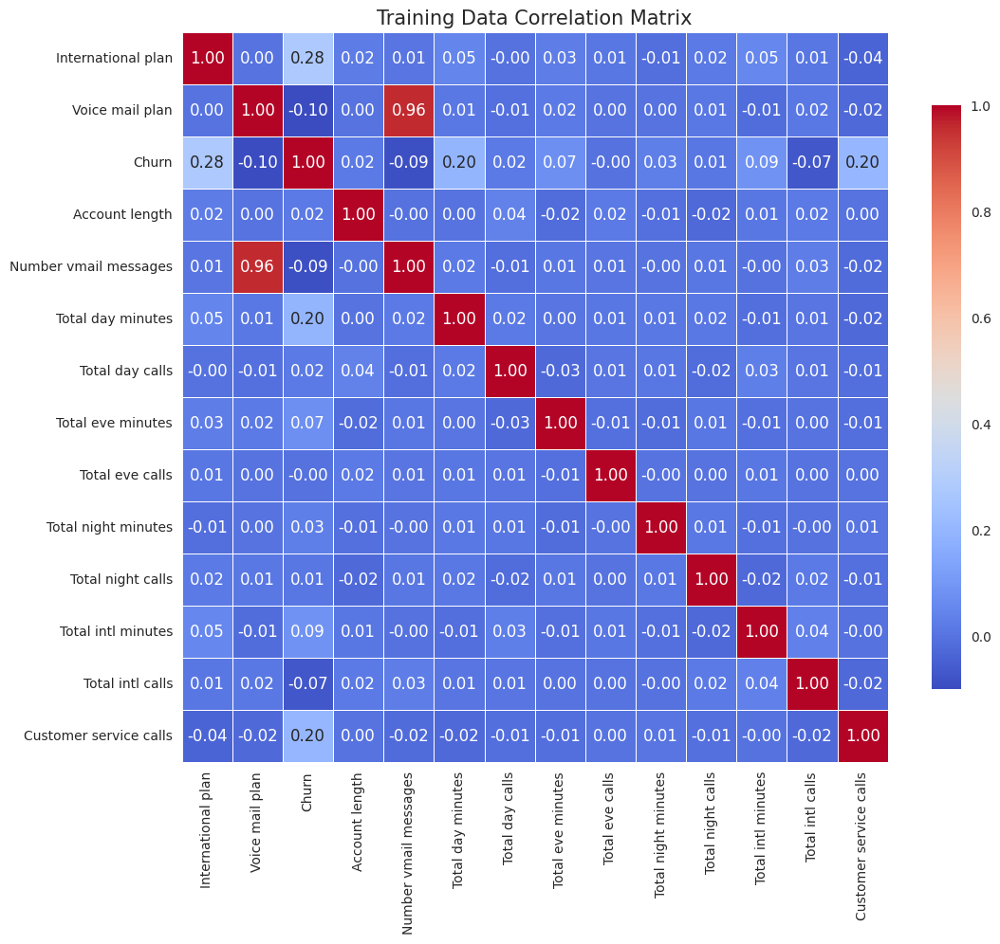

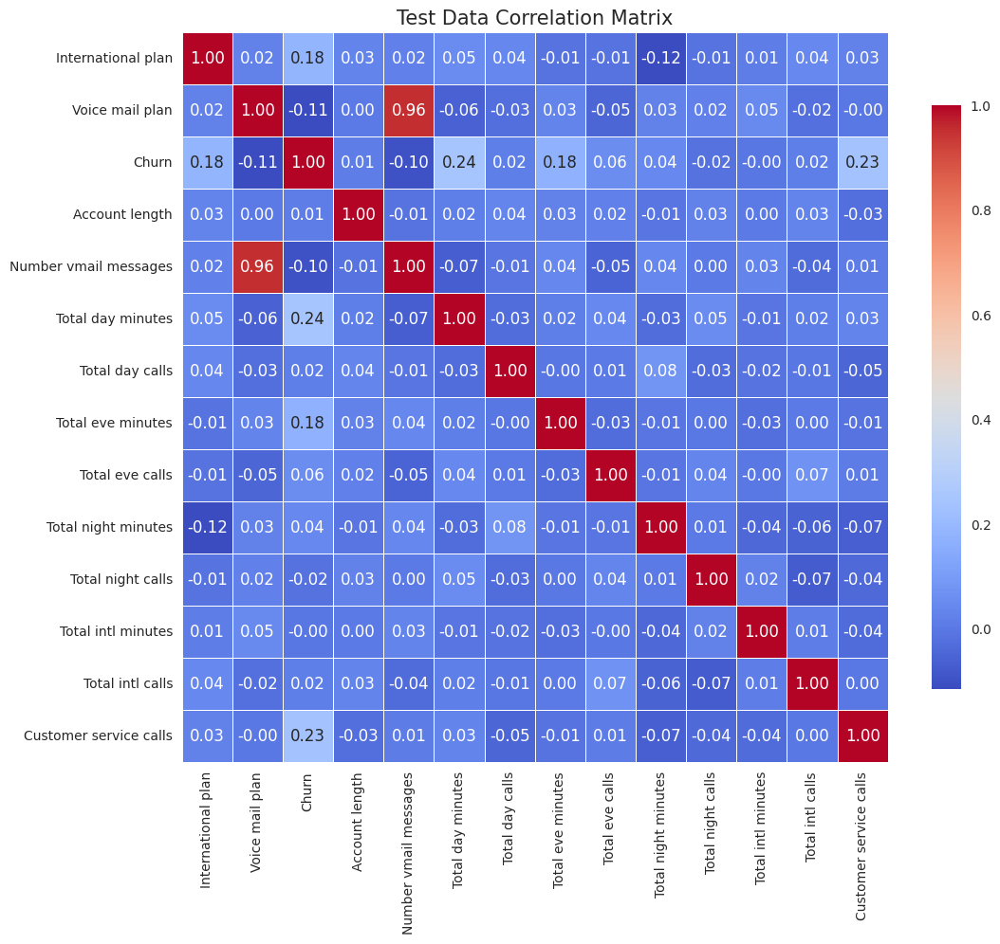

In [76]:
def plot_correlation_matrix(df, title="Correlation Matrix"):
    # Calculate the correlation matrix
    corr_matrix = df.corr()

    # Set up the matplotlib figure
    plt.figure(figsize=(12, 10))

    # Draw the heatmap
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5, cbar_kws={"shrink": .8})

    # Set the title
    plt.title(title, size=15)

    # Show the plot
    plt.show()


plot_correlation_matrix(telcom, title="Training Data Correlation Matrix")
plot_correlation_matrix(telcom_test, title="Test Data Correlation Matrix")


**3.3 PCA** is a dimensionality reduction technique that transforms the original features into a new set of features (principal components), which are linear combinations of the original features. The principal components are orthogonal and capture the maximum variance in the data.

In [77]:
#creates a scatter plot trace for PCA visualization


def pca_scatter(pcadf, targetfeature, targetlabel, color):
    tracer = go.Scatter(
        x=pcadf[pcadf[targetfeature] == targetlabel]["PC1"],
        y=pcadf[pcadf[targetfeature] == targetlabel]["PC2"],
        name=targetlabel,
        mode="markers",
        marker=dict(color=color, line=dict(width=0.5), symbol="diamond-open"),
    )
    return tracer


In [78]:
#Perform PCA

pca = PCA(n_components=2)

# Separate features and target
X = telcom[[col for col in telcom.columns if col not in target_col]]
Y = telcom[target_col]

# Fit and transform the data using PCA
principal_components = pca.fit_transform(X)
pca_data = pd.DataFrame(principal_components, columns=["PC1", "PC2"])

# Merge the target column back to the PCA result
pca_data = pca_data.merge(Y, left_index=True, right_index=True, how="left")
pca_data["Churn"] = pca_data["Churn"].replace({1: "Churn", 0: "Not churn"})


In [79]:
print(X)

      International plan  Voice mail plan  Account length  \
0                      0                1        0.692163   
1                      0                1        0.161278   
2                      0                0        0.919686   
3                      1                0       -0.420168   
4                      1                0       -0.647691   
...                  ...              ...             ...   
2661                   0                0       -0.546569   
2662                   0                1        2.310100   
2663                   0                0       -0.824652   
2664                   0                0       -1.835863   
2665                   0                1       -0.672971   

      Number vmail messages  Total day minutes  Total day calls  \
0                  1.247508           1.579670         0.484868   
1                  1.320985          -0.329918         1.135375   
2                 -0.589414           1.179302         0.685024   

In [80]:
pca_data

,PC1,PC2,Churn
0,1.450697,0.669424,Not churn
1,1.276441,1.102447,Not churn
2,-0.474839,1.857556,Not churn
3,-0.426344,-0.402018,Not churn
4,-0.879282,-0.093934,Not churn
...,...,...,...
2661,-0.661378,-0.818993,Not churn
2662,2.068322,1.020253,Not churn
2663,-0.576954,-2.314371,Not churn
2664,-0.520124,-0.684511,Not churn


In [81]:
#Define the Layout for Plotly Visualization
layout = go.Layout(
    dict(
        title="Visualizing data with PCA",
        plot_bgcolor="rgb(243,243,243)",
        paper_bgcolor="rgb(243,243,243)",
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            title="First Principal Component (PC1)",
            zerolinewidth=1,
            ticklen=5,
            gridwidth=2
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            title="Second Principal Component (PC2)",
            zerolinewidth=1,
            ticklen=5,
            gridwidth=2
        ),
        height=400
    )
)


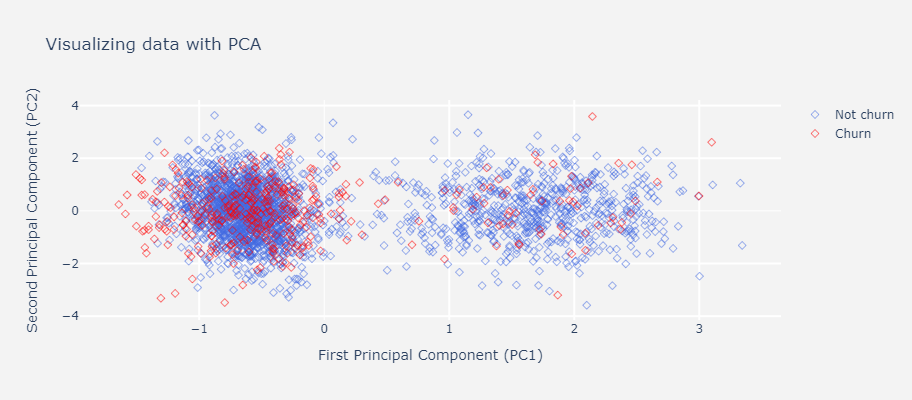

In [82]:
trace1 = pca_scatter(pca_data, 'Churn', 'Churn', 'red')
trace2 = pca_scatter(pca_data, 'Churn', 'Not churn', 'royalblue')

data = [trace2, trace1]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

**3.4 Visualization of Binary Feature Distribution for Churn Analysis**

In [83]:

def plot_radar(df, aggregate, title):
    
    # Filter dataframe by churn aggregate (1 for churn, 0 for not churn)
    data_frame = df[df["Churn"] == aggregate]
    
    # Sum up counts of 1's (yes) and 0's (no) for binary columns
    data_frame_x = data_frame[bi_cs].sum().reset_index()
    data_frame_x.columns = ["feature", "yes"]
    data_frame_x["no"] = data_frame.shape[0] - data_frame_x["yes"]
    data_frame_x = data_frame_x[data_frame_x["feature"] != "Churn"]
    
    # Plotting radar chart
    trace1 = go.Scatterpolar(
        r=data_frame_x["yes"].values.tolist(),
        theta=data_frame_x["feature"].tolist(),
        fill="toself",
        name="count of 1's",
        mode="markers+lines",
        marker=dict(size=5)
    )
    
    trace2 = go.Scatterpolar(
        r=data_frame_x["no"].values.tolist(),
        theta=data_frame_x["feature"].tolist(),
        fill="toself",
        name="count of 0's",
        mode="markers+lines",
        marker=dict(size=5)
    )
    
    # Setting layout for the radar chart
    layout = go.Layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
                side="counterclockwise",
                showline=True,
                linewidth=2,
                tickwidth=2,
                gridcolor="white",
                gridwidth=2
            ),
            angularaxis=dict(
                tickfont=dict(size=10),
                layer="below traces"
            ),
            bgcolor="rgb(243,243,243)"
        ),
        paper_bgcolor="rgb(243,243,243)",
        title=title,
        height=600,
        width=600
    )
    
    # Creating the plot figure
    fig = go.Figure(data=[trace2, trace1], layout=layout)
    py.iplot(fig)


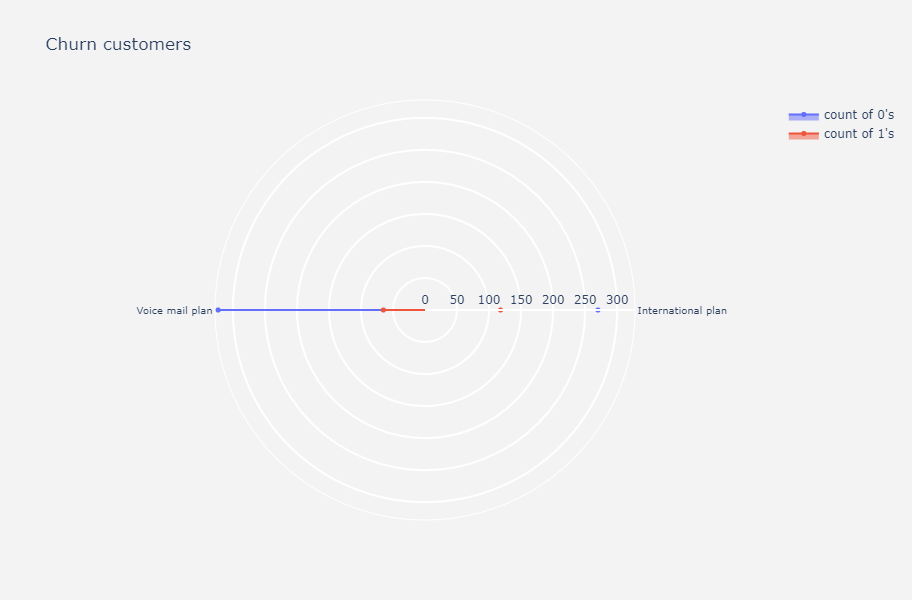

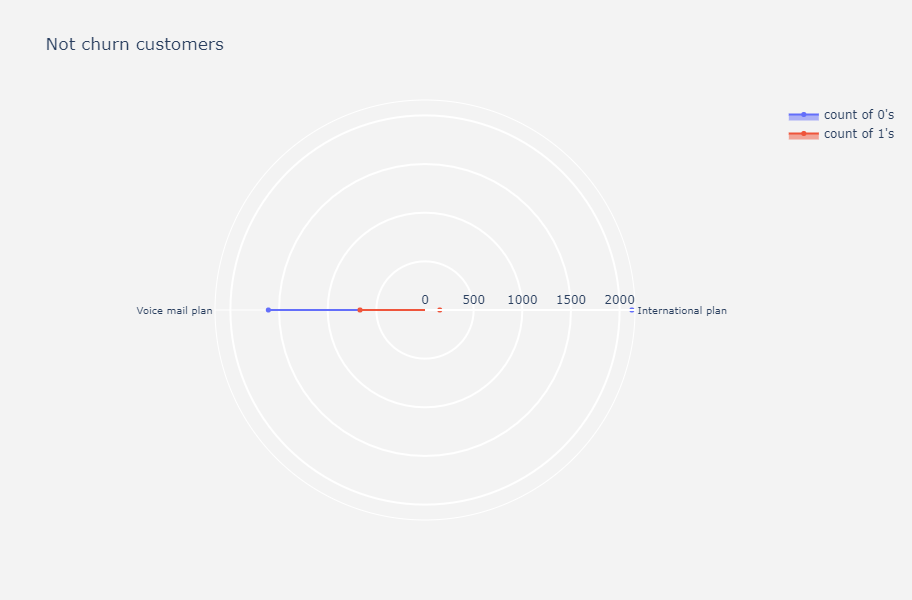

In [84]:
# `telcom` and `bi_cs` are defined as per your dataset
bi_cs = telcom.nunique()[telcom.nunique() == 2].keys()
dat_rad = telcom[bi_cs]

# Plotting radar chart for churn and not churn customers
plot_radar(dat_rad, 1, "Churn customers")
plot_radar(dat_rad, 0, "Not churn customers")


**Voice Mail Plan Distribution:**

Both churn and non-churn customers predominantly do not have a voice mail plan.
The absence of a voice mail plan is more pronounced among churn customers, suggesting a potential protective effect against churn for those who have a voice mail plan.

**International Plan Distribution:**
Both churn and non-churn customers generally do not have an international plan.
The distribution of the international plan feature is similar in both groups, indicating it is not a significant differentiating factor for churn.


# 4. Model Building

In [85]:

def telecom_churn_prediction(algorithm, train_x, test_x, train_y, test_y, cf='None', threshold_plot=False):
    
   # Model Training and Prediction
    algorithm.fit(train_x, train_y)
    predictions = algorithm.predict(test_x)
    probabilities = algorithm.predict_proba(test_x)[:, 1]
    
    # Performance Metrics
    print('Algorithm:', type(algorithm).__name__)
    print("\nClassification report:\n", classification_report(test_y, predictions))
    print("Accuracy Score:", accuracy_score(test_y, predictions))
    
    # Confusion matrix and ROC AUC score
    conf_matrix = confusion_matrix(test_y, predictions)
    roc_auc = roc_auc_score(test_y, probabilities)
    print("Area under curve:", roc_auc, "\n")
    
    # Plotting Confusion Matrix and ROC Curve
    fpr, tpr, _ = roc_curve(test_y, probabilities)
    trace1 = go.Heatmap(z=conf_matrix, x=["Not churn", "Churn"], y=["Not churn", "Churn"],
                       showscale=False, colorscale="Picnic", name="Confusion matrix")
    trace2 = go.Scatter(x=fpr, y=tpr, name=f"ROC: {roc_auc:.2f}",
                        line=dict(color='rgb(22, 96, 167)', width=2))
    trace3 = go.Scatter(x=[0, 1], y=[0, 1],
                        line=dict(color='rgb(205, 12, 24)', width=2, dash='dot'))
    
    #Feature Importance or Coefficients Plot

    if cf in ['coefficients', 'features']:
        if cf == 'coefficients':
            coefficients = pd.DataFrame(algorithm.coef_.ravel(), columns=["coefficients"])
        elif cf == 'features':
            coefficients = pd.DataFrame(algorithm.feature_importances_, columns=["coefficients"])
        
        column_df = pd.DataFrame(train_x.columns, columns=["features"])
        coef_sumry = pd.concat([coefficients, column_df], axis=1).sort_values(by="coefficients", ascending=False)
        
        # Feature importance bar plot
        trace4 = go.Bar(x=coef_sumry["features"], y=coef_sumry["coefficients"], 
                        name="coefficients",
                        marker=dict(color=coef_sumry["coefficients"], colorscale="Picnic",
                                    line=dict(width=.6, color="black")))
        
        # Subplots
        fig = make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion matrix', 'Receiver operating characteristic', 'Feature importances'))
        fig.add_trace(trace1, 1, 1)
        fig.add_trace(trace2, 1, 2)
        fig.add_trace(trace3, 1, 2)
        fig.add_trace(trace4, 2, 1)
        fig.update_layout(showlegend=False, title="Model performance", autosize=False, height=900, width=800,
                          plot_bgcolor='rgba(240,240,240, 0.95)', paper_bgcolor='rgba(240,240,240, 0.95)',
                          margin=dict(b=195))
        fig.update_xaxes(title="False positive rate", row=1, col=2)
        fig.update_yaxes(title="True positive rate", row=1, col=2)
        fig.update_xaxes(showgrid=True, tickfont=dict(size=10), tickangle=90, row=2, col=1)

    else:
        # Subplots for confusion matrix and ROC curve
        fig = make_subplots(rows=1, cols=2, subplot_titles=('Confusion matrix', 'Receiver operating characteristic'))
        fig.add_trace(trace1, 1, 1)
        fig.add_trace(trace2, 1, 2)
        fig.add_trace(trace3, 1, 2)
        fig.update_layout(showlegend=False, title="Model performance", autosize=False, height=500, width=800,
                          plot_bgcolor='rgba(240,240,240,0.95)', paper_bgcolor='rgba(240,240,240,0.95)',
                          margin=dict(b=195))
        fig.update_xaxes(title="False positive rate", row=1, col=2)
        fig.update_yaxes(title="True positive rate", row=1, col=2)

    py.iplot(fig)
    
    # Optional Threshold Visualizer
    if threshold_plot:
        visualizer = DiscriminationThreshold(algorithm)
        visualizer.fit(train_x, train_y)
        visualizer.show()



In [86]:
# Define the columns to be used as features and the target column
def define_features_target(dataframe, target_column):
    features = [col for col in dataframe.columns if col not in target_column]
    return features, target_column

# Split the dataset into training and testing sets
def split_dataset(dataframe, features, target, test_size=0.25, random_state=111):
    x_train, x_test, y_train, y_test = train_test_split(dataframe[features], dataframe[target], 
                                                        test_size=test_size, random_state=random_state)
    return x_train, x_test, y_train, y_test

# Main code
if __name__ == "__main__":
    target_col = ['Churn']
    
    # Define features and target
    cols, target_col = define_features_target(telcom, target_col)
    
    # Split the principal training dataset into subtrain and subtest datasets
    x_train, x_test, y_train, y_test = split_dataset(telcom, cols, target_col)
    
    # Split the no scaled principal training dataset into subtrain and subtest datasets
    x_train_og, x_test_og, y_train_og, y_test_og = split_dataset(df_telcom_og, cols, target_col)

**4.1 Logistic Regression**

Algorithm: LogisticRegression

Classification report:
               precision    recall  f1-score   support

           0       0.84      0.97      0.90       547
           1       0.52      0.13      0.21       120

    accuracy                           0.82       667
   macro avg       0.68      0.55      0.56       667
weighted avg       0.78      0.82      0.78       667

Accuracy Score: 0.8215892053973014
Area under curve: 0.7781992687385741 



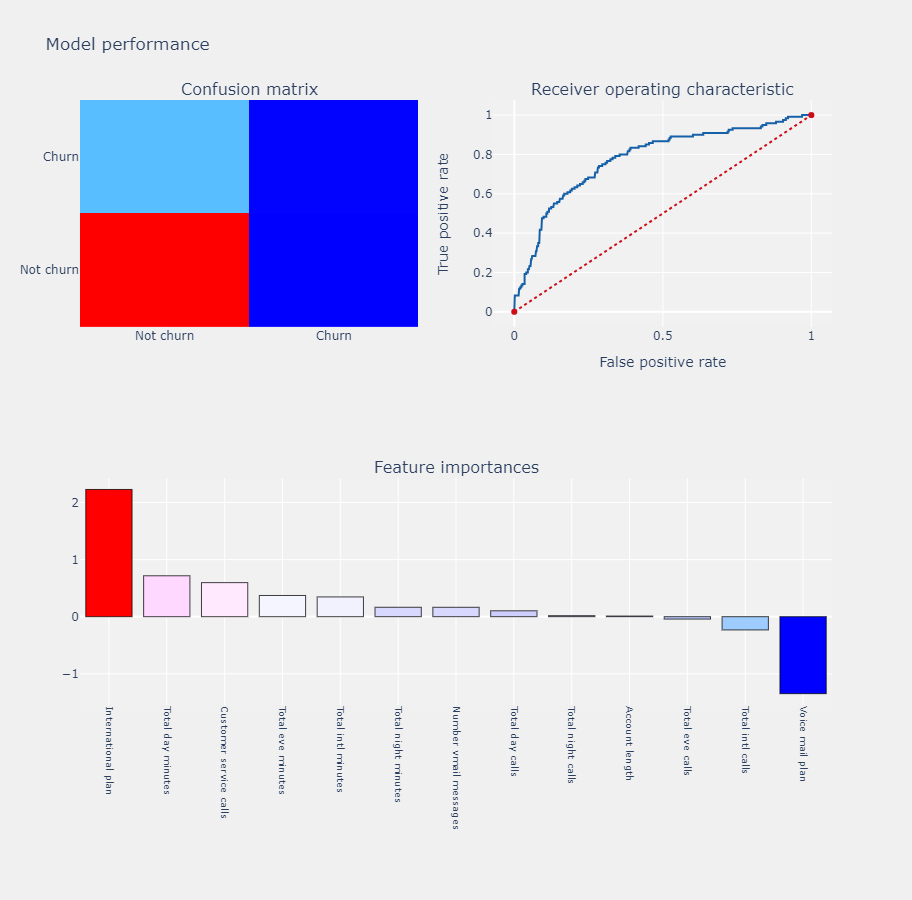

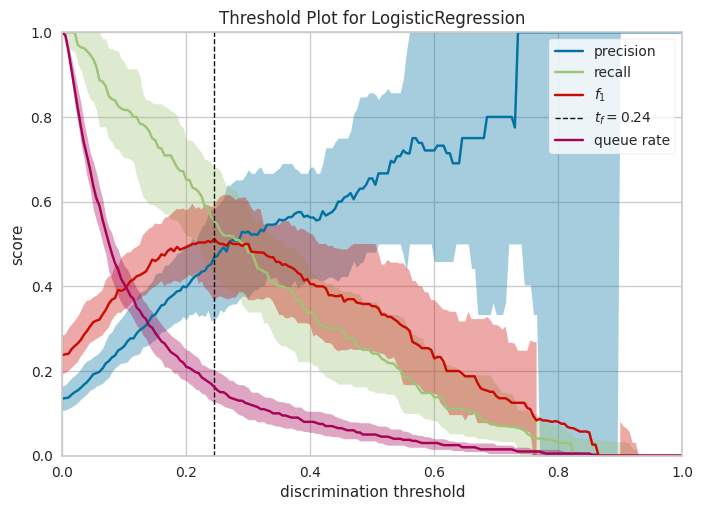

In [87]:


#Baseline model        
logit = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                           intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                           penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
                           verbose=0, warm_start=False)

telecom_churn_prediction(logit, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

**4.2 SMOTE**

*  By synthesizing new minority class instances rather than duplicating existing ones, SMOTE avoids overfitting and can improve the generalization of the model.
 
*  It can effectively balance class distribution, making the classifier less biased towards the majority class.

In [88]:
pip show imbalanced-learn


Name: imbalanced-learn
Version: 0.12.3
Summary: Toolbox for imbalanced dataset in machine learning.
Home-page: https://github.com/scikit-learn-contrib/imbalanced-learn
Author: 
Author-email: 
License: MIT
Location: /opt/conda/lib/python3.10/site-packages
Requires: joblib, numpy, scikit-learn, scipy, threadpoolctl
Required-by: 
Note: you may need to restart the kernel to use updated packages.


Algorithm: LogisticRegression

Classification report:
               precision    recall  f1-score   support

           0       0.92      0.76      0.83       547
           1       0.39      0.70      0.50       120

    accuracy                           0.75       667
   macro avg       0.65      0.73      0.66       667
weighted avg       0.82      0.75      0.77       667

Accuracy Score: 0.7451274362818591
Area under curve: 0.7873705057891529 



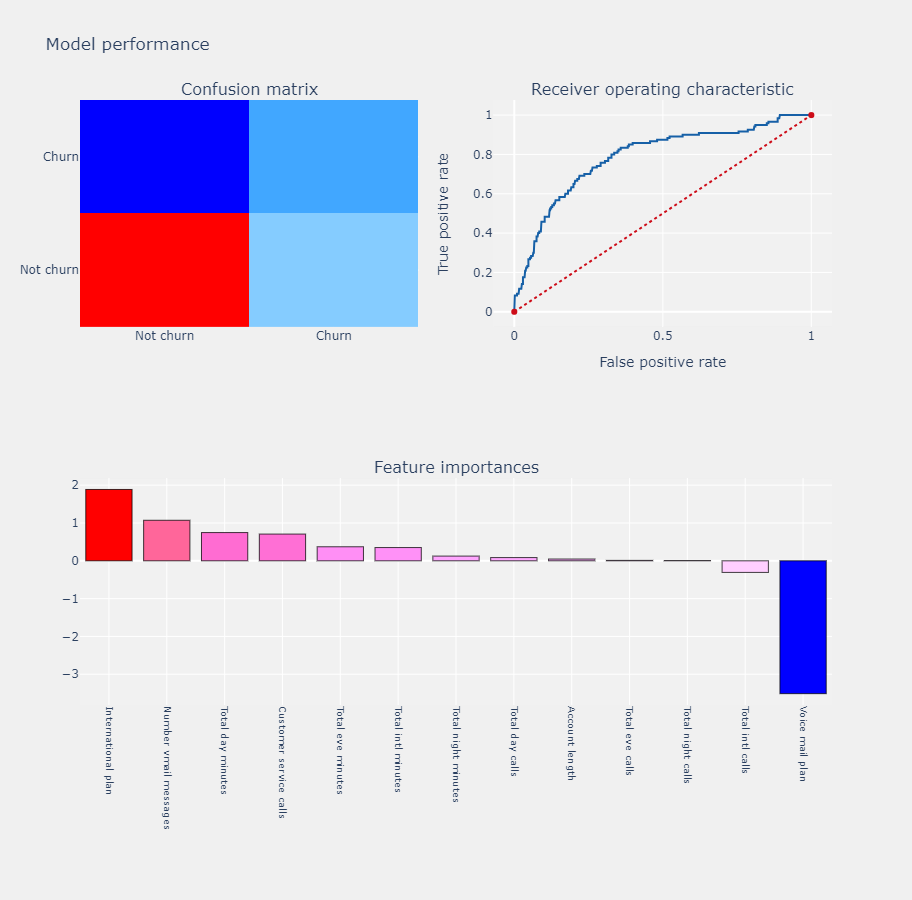

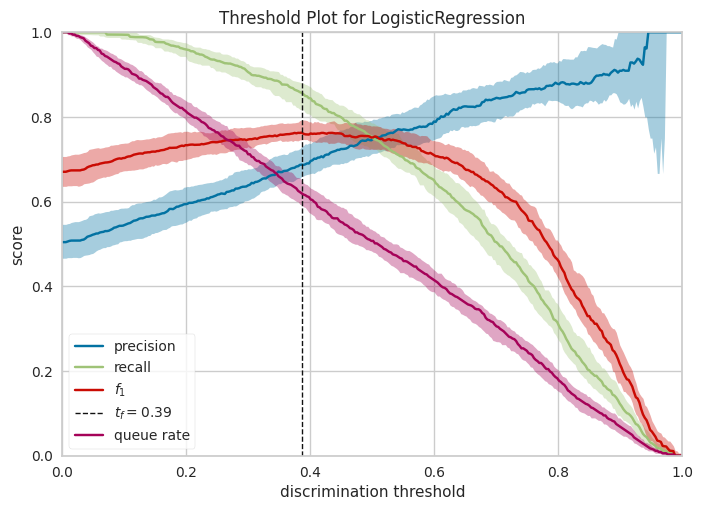

In [89]:


#oversampling minority class using smote
smote = SMOTE(random_state = 0)
x_smote, y_smote = smote.fit_resample(x_train, y_train)

x_smote = pd.DataFrame(data = x_smote, columns=cols)
y_smote = pd.DataFrame(data = y_smote, columns=target_col)

logit_smote = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                                 intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                                 penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
                                 verbose=0, warm_start=False)

telecom_churn_prediction(logit_smote, x_smote, x_test, y_smote, y_test, "coefficients", threshold_plot=True)

**4.3 Recursive Feature Elimination (RFE)** is a feature selection technique that aims to select the most relevant features by recursively considering smaller and smaller sets of features. The key idea is to iteratively train the model using subsets of features and eliminate the least important features based on a specified criterion (often feature importance or coefficients).

Algorithm: LogisticRegression

Classification report:
               precision    recall  f1-score   support

           0       0.84      0.97      0.90       547
           1       0.50      0.13      0.21       120

    accuracy                           0.82       667
   macro avg       0.67      0.55      0.55       667
weighted avg       0.78      0.82      0.77       667

Accuracy Score: 0.8200899550224887
Area under curve: 0.7786410725167581 



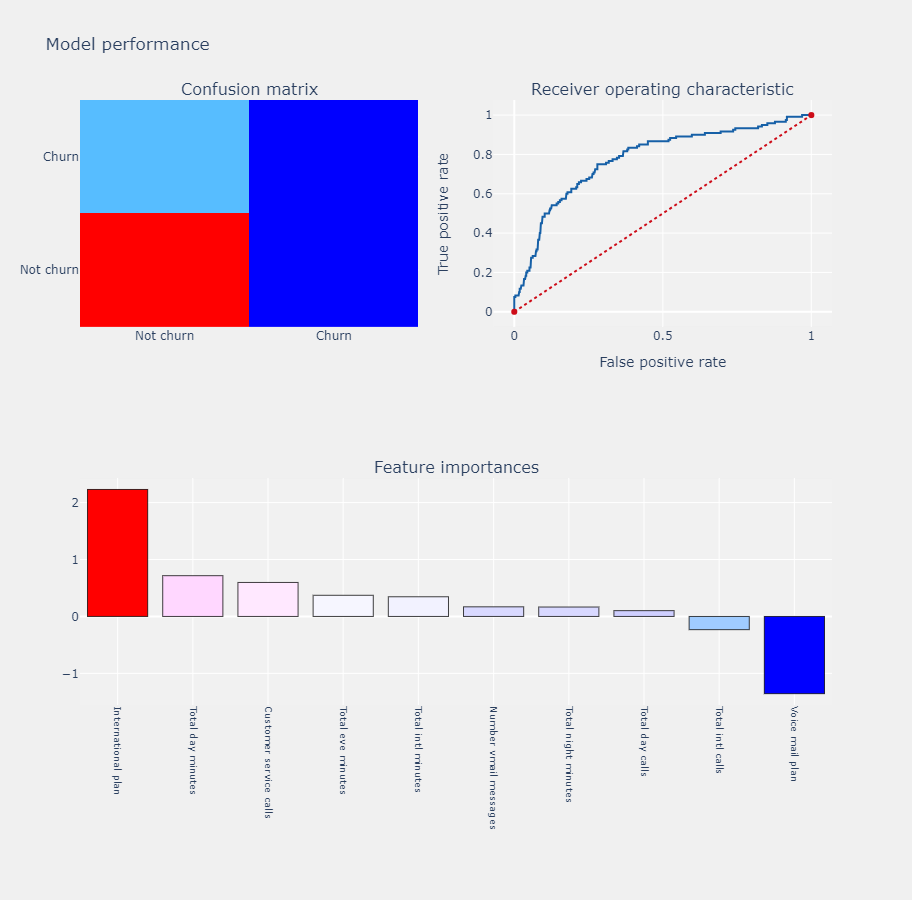

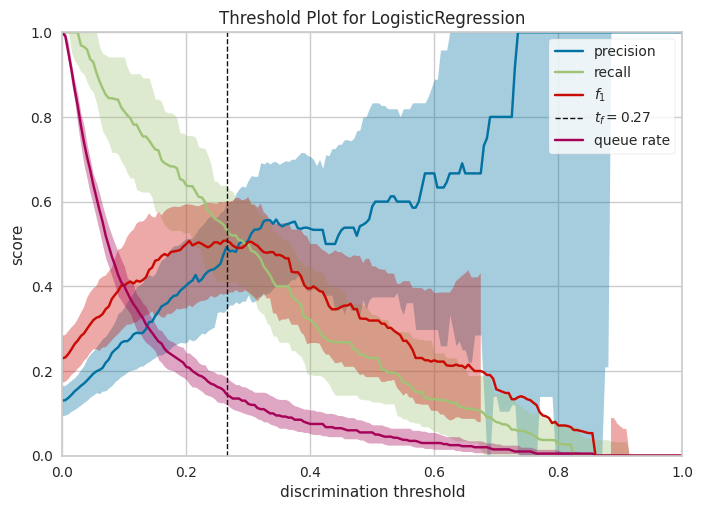

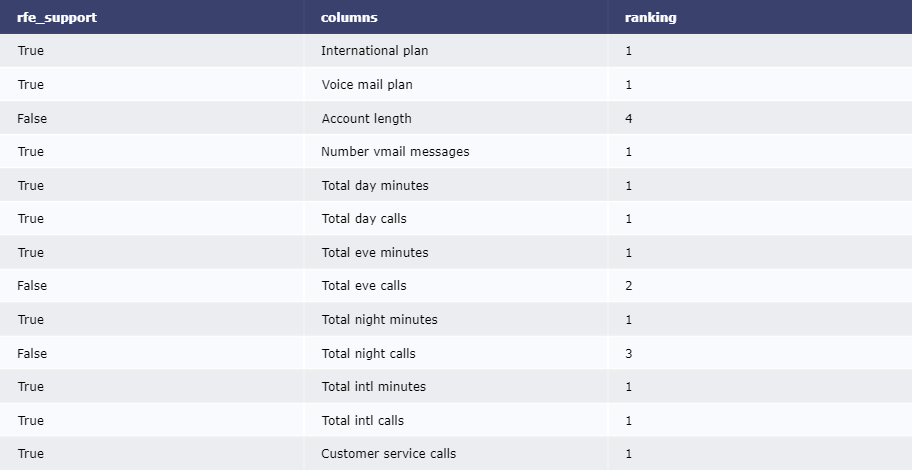

In [90]:
logit_rfe = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                                 intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                                 penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
                                 verbose=0, warm_start=False)

rfe = RFE(logit_rfe, n_features_to_select=10, step=1)
# Fit RFE to training data
rfe = rfe.fit(x_train, y_train.values.ravel())

#identified columns Recursive Feature Elimination
selected_rfe = pd.DataFrame({"rfe_support": rfe.support_,
                        "columns": cols,
                        "ranking": rfe.ranking_,
                       })
cols_rfe = selected_rfe[selected_rfe["rfe_support"] == True]["columns"].tolist()


#applying model
telecom_churn_prediction(logit_rfe, x_train[cols_rfe], x_test[cols_rfe], y_train, y_test, "coefficients", threshold_plot=True)

table_rk = ff.create_table(selected_rfe)
py.iplot(table_rk)

**4.4 Decision Tree Classifier**

Algorithm: DecisionTreeClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.93      0.93      0.93       547
           1       0.67      0.67      0.67       120

    accuracy                           0.88       667
   macro avg       0.80      0.80      0.80       667
weighted avg       0.88      0.88      0.88       667

Accuracy Score: 0.8800599700149925
Area under curve: 0.7967702620353442 



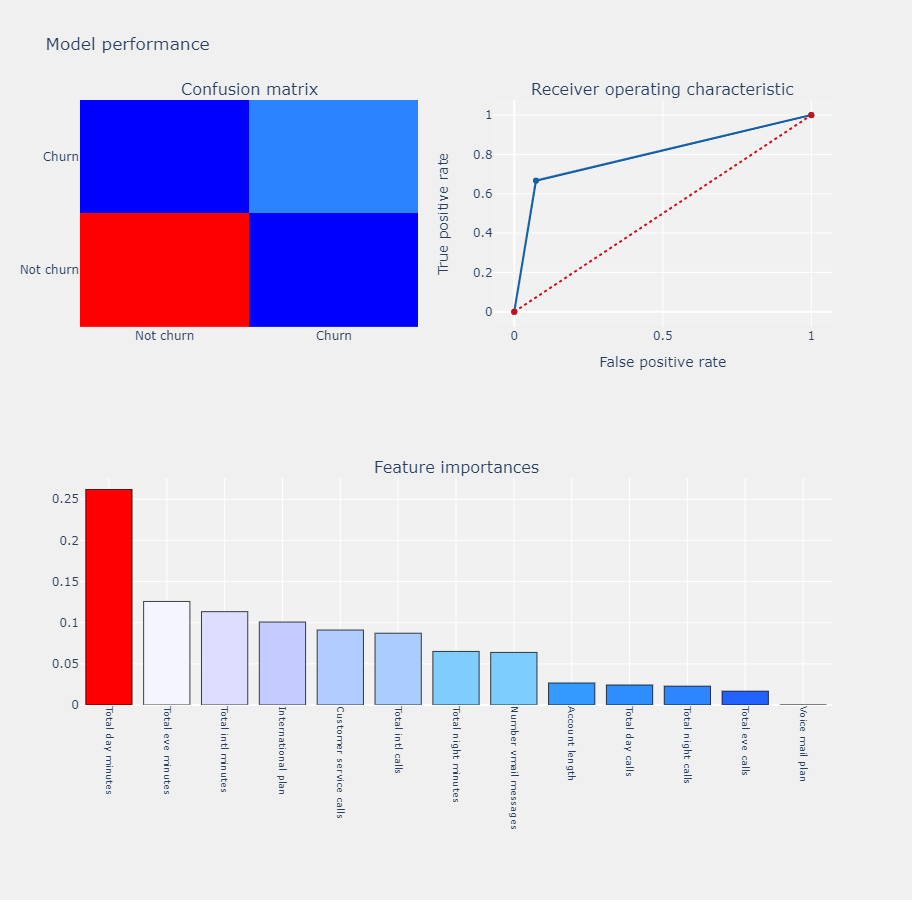

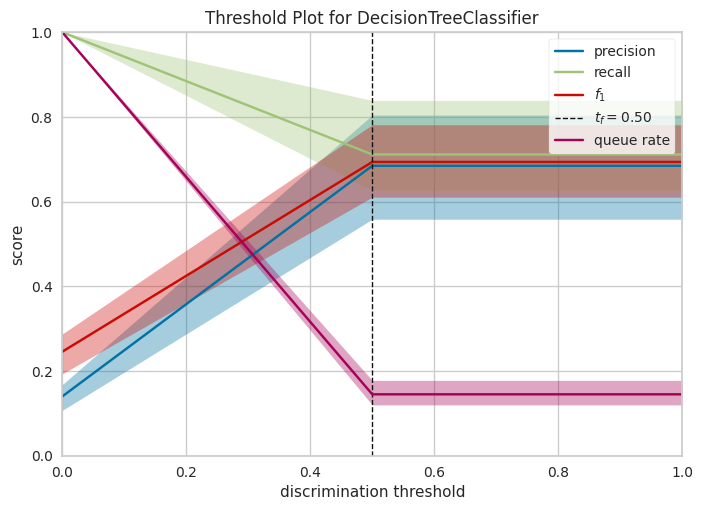

In [91]:
# Create the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Call the prediction function with the Decision Tree model
telecom_churn_prediction(dt_model, x_train, x_test, y_train, y_test, "features", threshold_plot=True)



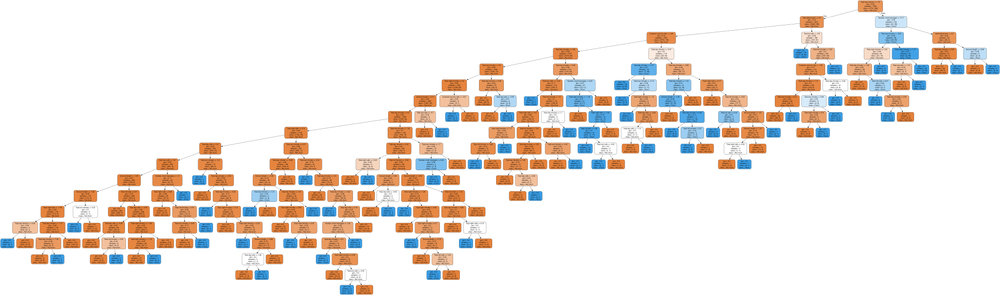

In [92]:
def treeplot(classifier, cols, classnames):
    #plot decision tree
    graph = Source(tree.export_graphviz(classifier, out_file=None, 
                                        rounded=True, proportion=False,
                                        feature_names = cols, 
                                        precision = 2,
                                        class_names = classnames,
                                        filled = True)
                  )
    display(graph)
    
    #plot decision tree
treeplot(dt_model, cols, ["Not churn", "Churn"])

**4.5 KNN classifier**

Algorithm: KNeighborsClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92       547
           1       0.91      0.17      0.29       120

    accuracy                           0.85       667
   macro avg       0.88      0.59      0.60       667
weighted avg       0.86      0.85      0.80       667

Accuracy Score: 0.848575712143928
Area under curve: 0.7955286410725166 



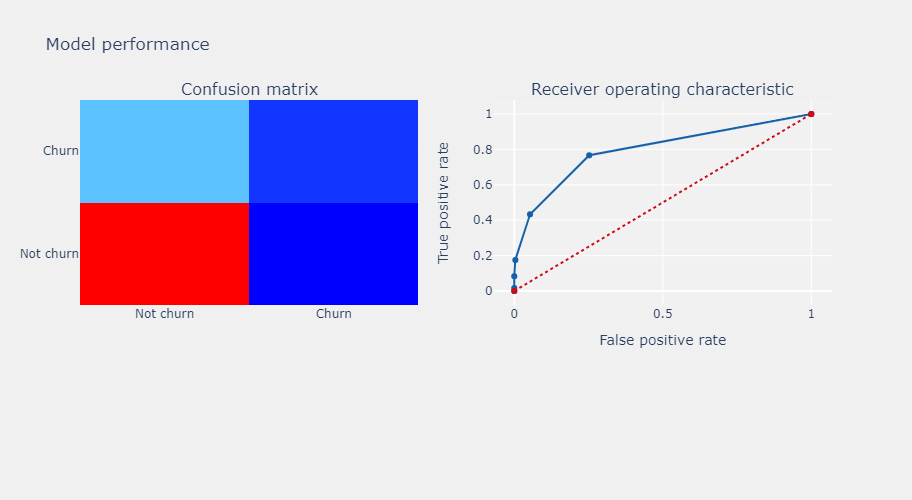

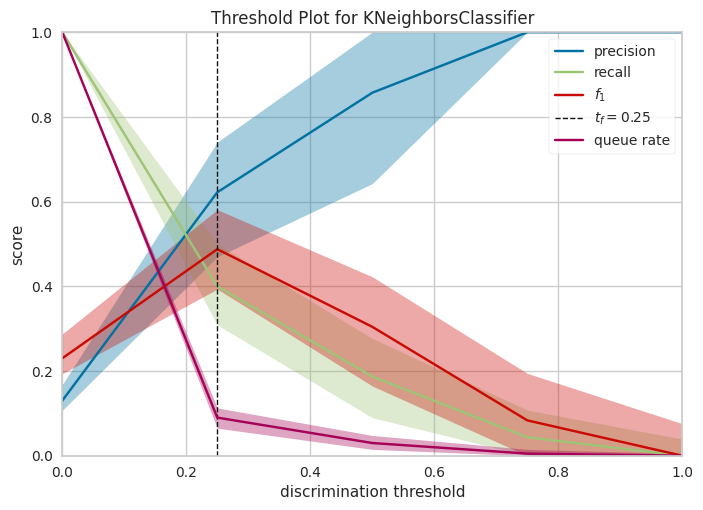

In [93]:

knn = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
                           weights='uniform')
telecom_churn_prediction(knn, x_train, x_test, y_train, y_test, 'None', threshold_plot=True)


**4.6 Random Forest classifier** is an ensemble learning method that aims to improve the accuracy and robustness of predictions compared to individual decision trees. It combines multiple decision trees to form a "forest," each trained on random subsets of the data and features.

Algorithm: RandomForestClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.92      0.99      0.95       547
           1       0.93      0.62      0.74       120

    accuracy                           0.92       667
   macro avg       0.92      0.80      0.85       667
weighted avg       0.92      0.92      0.92       667

Accuracy Score: 0.9220389805097451
Area under curve: 0.9090188909201707 



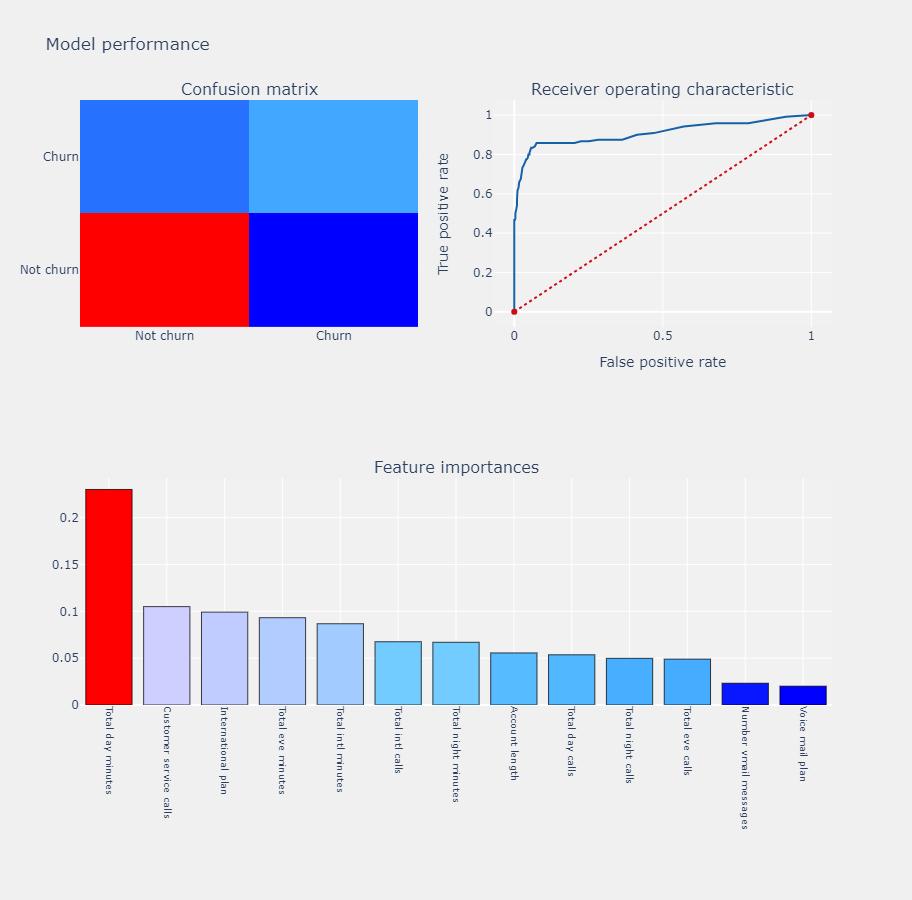

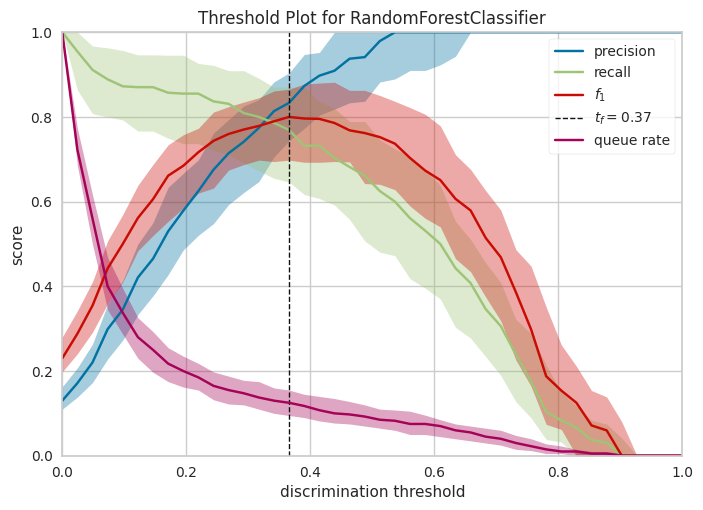

In [94]:
# Create the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Call the prediction function with the Decision Tree model
telecom_churn_prediction(rf_model, x_train, x_test, y_train, y_test, 'features', threshold_plot=True)


**4.7 Gaussian Naive Bayes**

Algorithm: GaussianNB

Classification report:
               precision    recall  f1-score   support

           0       0.87      0.92      0.89       547
           1       0.50      0.35      0.41       120

    accuracy                           0.82       667
   macro avg       0.68      0.64      0.65       667
weighted avg       0.80      0.82      0.81       667

Accuracy Score: 0.8200899550224887
Area under curve: 0.8210542352224254 



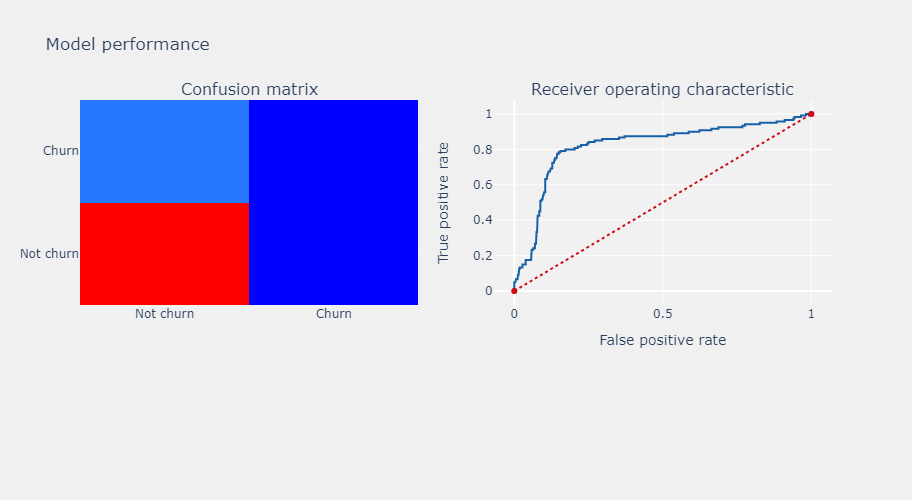

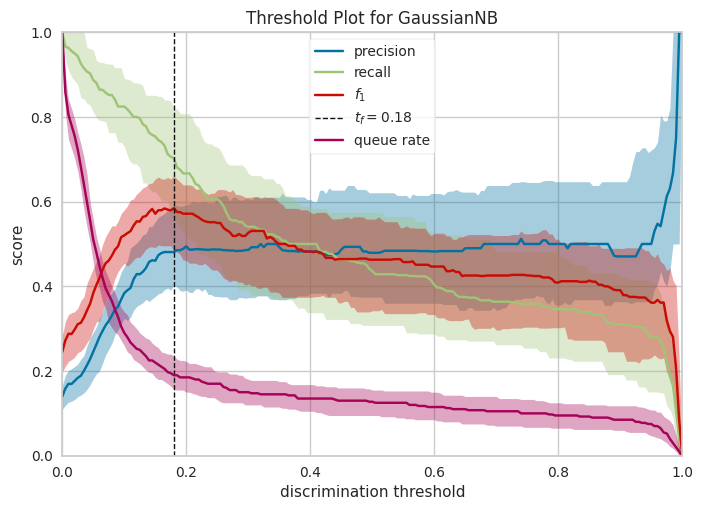

In [95]:


gnb = GaussianNB(priors=None)

telecom_churn_prediction(gnb, x_train, x_test, y_train, y_test, 'None', threshold_plot=True)

**4.8 Support Vector Machine** is primarily used for classification tasks but can also be employed for regression and outlier detection.In this algorithm, we plot each data item as a point in n-dimensional space .where n is number of features you have) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the hyper-plane that differentiate the two classes.

Algorithm: SVC

Classification report:
               precision    recall  f1-score   support

           0       0.82      1.00      0.90       547
           1       0.00      0.00      0.00       120

    accuracy                           0.82       667
   macro avg       0.41      0.50      0.45       667
weighted avg       0.67      0.82      0.74       667

Accuracy Score: 0.8200899550224887
Area under curve: 0.7324954296160877 



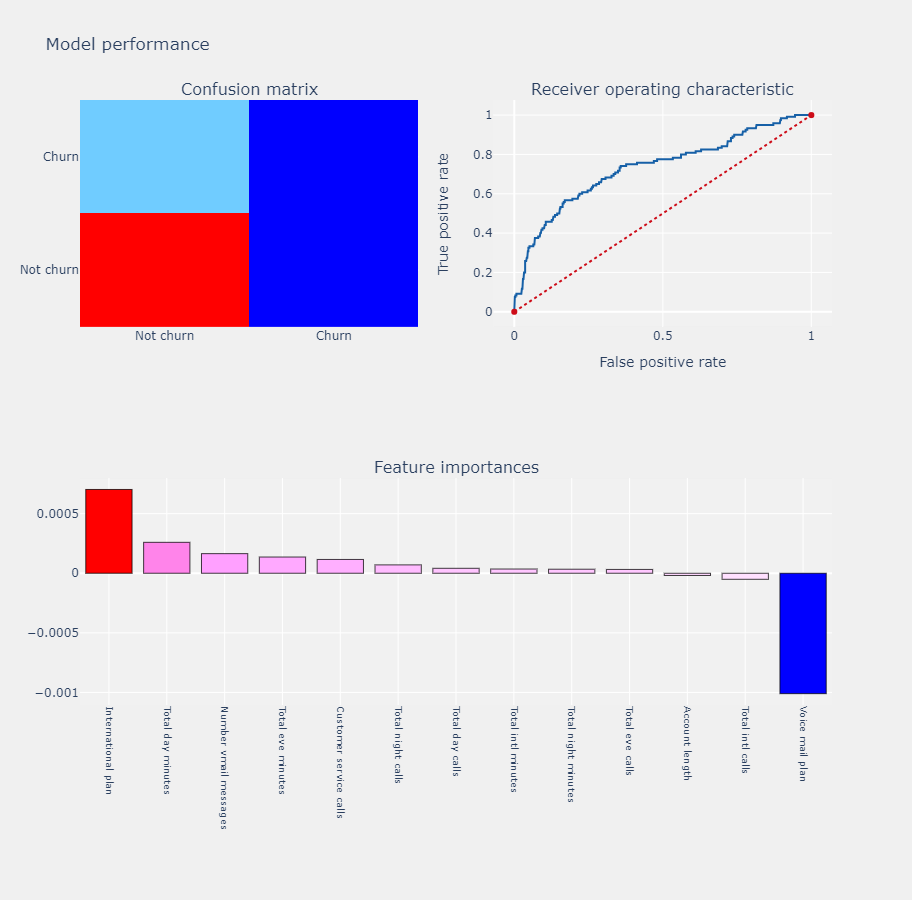

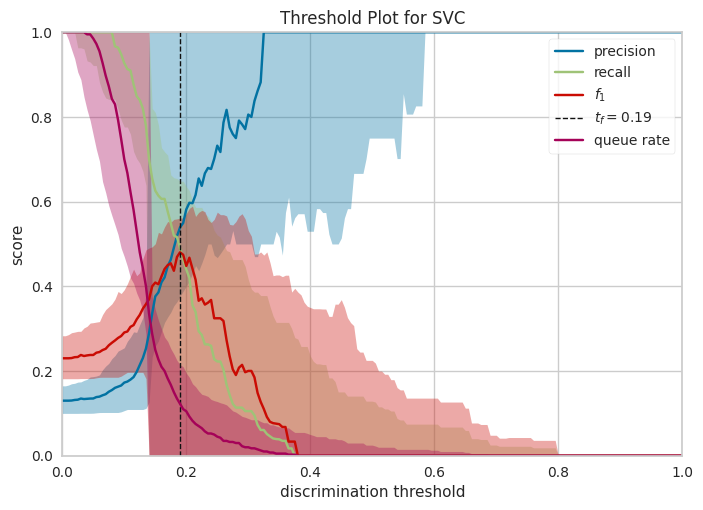

In [96]:
#Support vector classifier using linear hyper plane
svc_lin  = SVC(C=1.0, kernel='linear', probability=True, random_state=124) 


telecom_churn_prediction(svc_lin, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Algorithm: SVC

Classification report:
               precision    recall  f1-score   support

           0       0.92      0.97      0.94       547
           1       0.81      0.61      0.70       120

    accuracy                           0.90       667
   macro avg       0.86      0.79      0.82       667
weighted avg       0.90      0.90      0.90       667

Accuracy Score: 0.904047976011994
Area under curve: 0.8806215722120658 



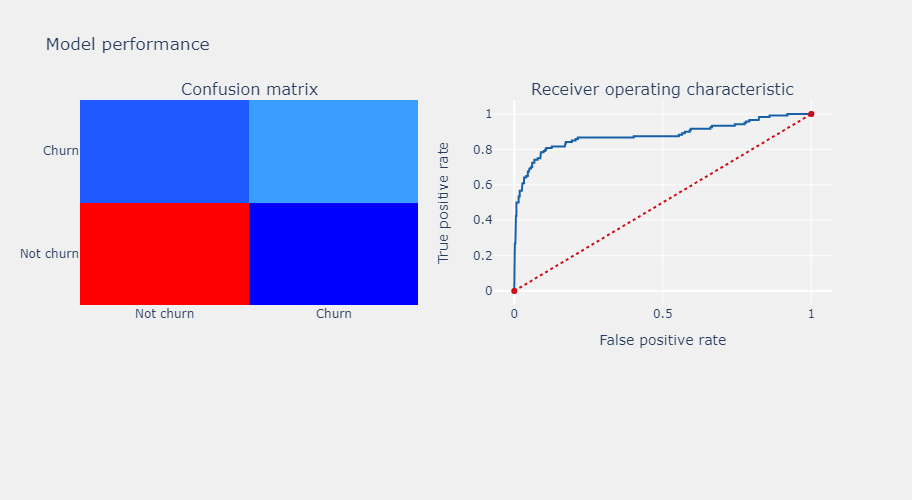

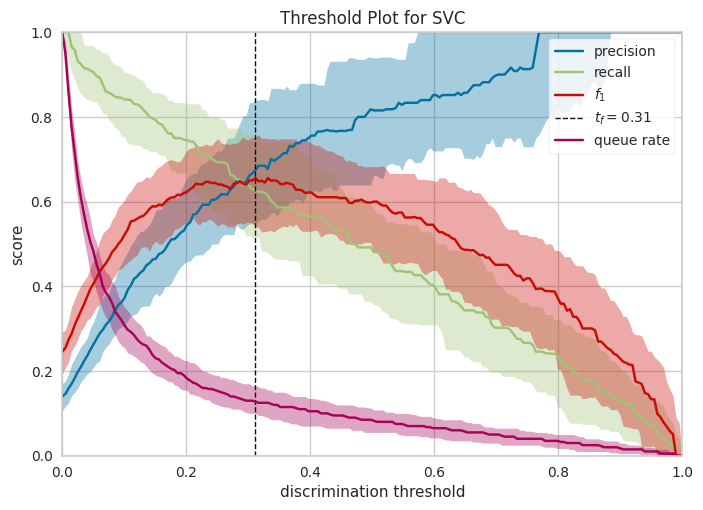

In [97]:
#support vector classifier using non-linear hyper plane ("rbf")
svc_rbf  = SVC(C=10.0, kernel='rbf', gamma=0.1, probability=True, random_state=124)   

telecom_churn_prediction(svc_rbf, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

* The RBF kernel SVM uses a radial basis function to map the input features into higher-dimensional space where a linear separation is possible. 
*  A lower C values leads to a wider margin but more misclassifications, while higher C values aim for fewer misclassifications but a smaller margin.
* The gamma parameter controls the influence of individual training examples. A lower gamma value means a broader influence of each example, while a higher gamma value means a narrower, more focused influence.
* Mode='None': For the RBF kernel, feature coefficients are not directly interpretable, hence mode is set to 'None'.

**4.9  Multi-layer Perceptron Classifier** :is a type of artificial neural network (ANN) that is composed of multiple layers of nodes, each fully connected to the nodes in the subsequent layer. It is often used for supervised learning tasks such as classification and regression.

Algorithm: MLPClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.92      0.97      0.95       547
           1       0.83      0.62      0.71       120

    accuracy                           0.91       667
   macro avg       0.88      0.80      0.83       667
weighted avg       0.91      0.91      0.90       667

Accuracy Score: 0.9100449775112444
Area under curve: 0.8980347349177331 



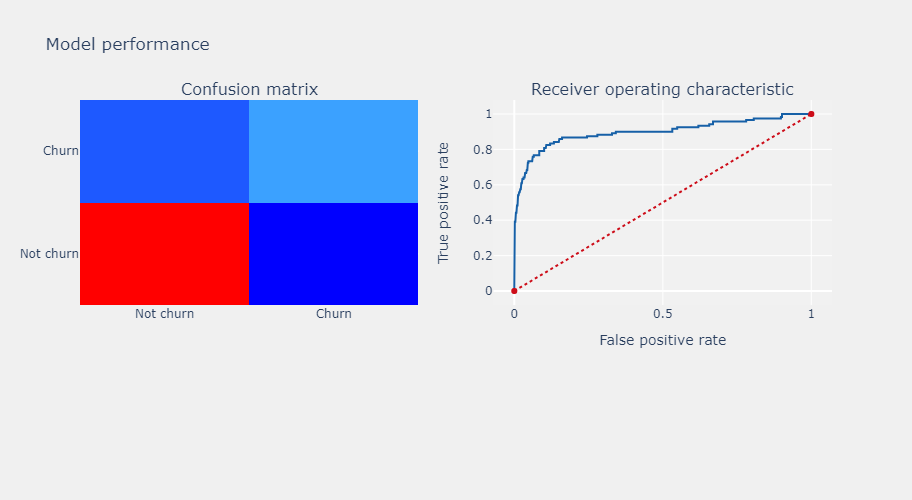

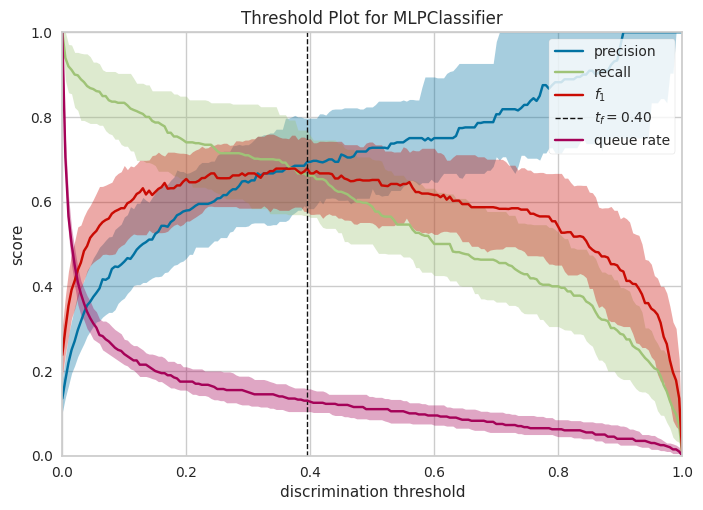

In [100]:
# Create an MLP classifier
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, activation='relu', solver='adam', random_state=42)
telecom_churn_prediction(mlp, x_train, x_test, y_train, y_test, "None", threshold_plot=True)

# 5. Model performances over the training dataset

In [103]:
#putting all the model names, model classes and the used columns in a dictionary
models = {'Logistic (Baseline)': [logit, cols],
          'Logistic (SMOTE)': [logit_smote, cols], 
          'Logistic (RFE)': [logit_rfe, cols_rfe], 
          'Decision Tree': [dt_model, cols], 
          'KNN Classifier': [knn, cols], 
          'Random Forest': [rf_model, cols], 
          'Naive Bayes': [gnb, cols], 
          'SVM (linear)': [svc_lin, cols], 
          'SVM (rbf)': [svc_rbf, cols],
          'MLP Classifier': [mlp, cols], 
         }

**5.1 Model performance metrics**

In [108]:

def model_report(model, X_train, X_test, y_train, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Create a DataFrame with the results
    report_df = pd.DataFrame({
        'Model': [model_name],
        'Accuracy': [accuracy],
        'Precision': [precision],
        'Recall': [recall],
        'F1 Score': [f1]
    })
    
    return report_df



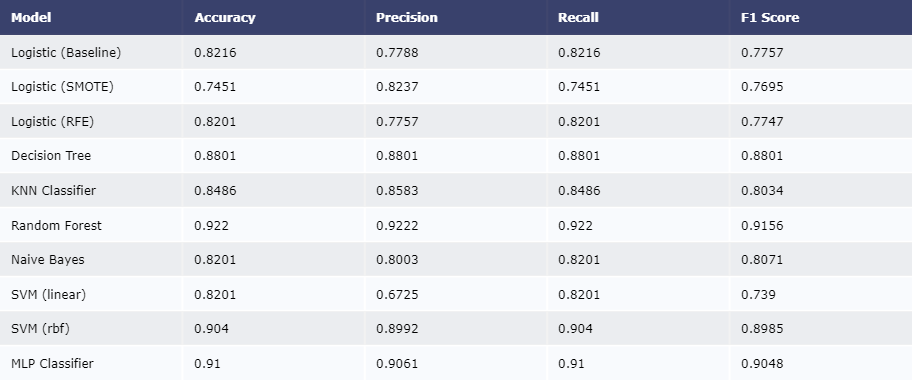

In [110]:
model_performances_train = pd.DataFrame() 
reports = []

for name in models:
    if name == 'Logistic (SMOTE)':
        report = model_report(models[name][0], 
                              x_smote[models[name][1]], 
                              x_test[models[name][1]], 
                              y_smote, 
                              y_test, 
                              name)
    else:
        report = model_report(models[name][0], 
                              x_train[models[name][1]], 
                              x_test[models[name][1]], 
                              y_train, 
                              y_test, 
                              name)
    reports.append(report)

# Concatenate all reports into a single DataFrame
model_performances_train = pd.concat(reports, ignore_index=True)

# Display the table (assuming ff and py are properly defined for plotly table creation)
import plotly.figure_factory as ff
import plotly.io as pio

table_train = ff.create_table(np.round(model_performances_train, 4))
pio.show(table_train)


**5.2 Compare the metrics**

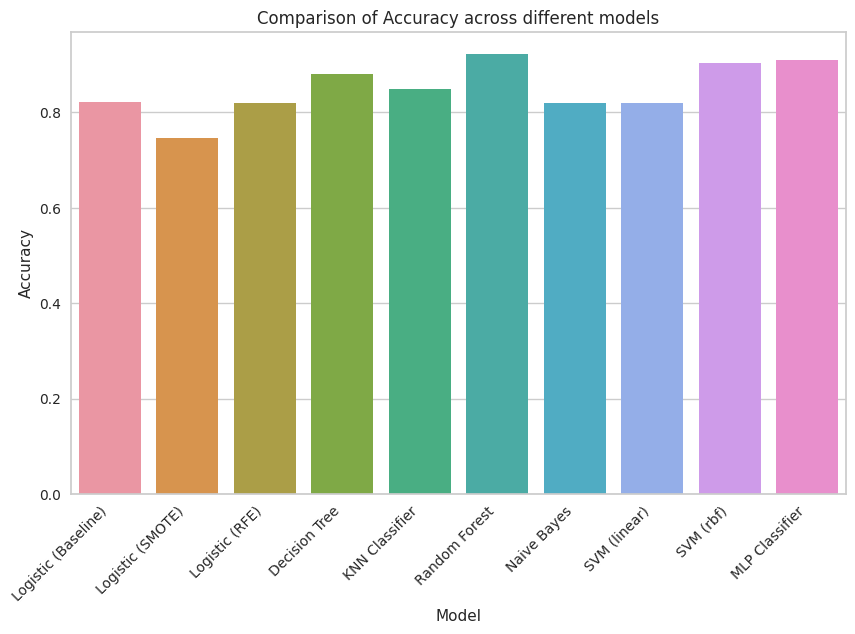

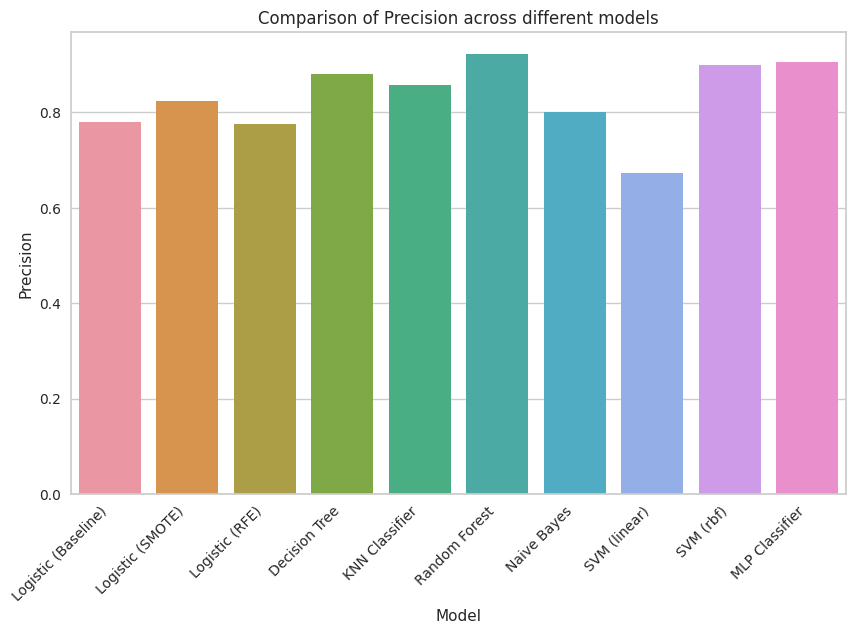

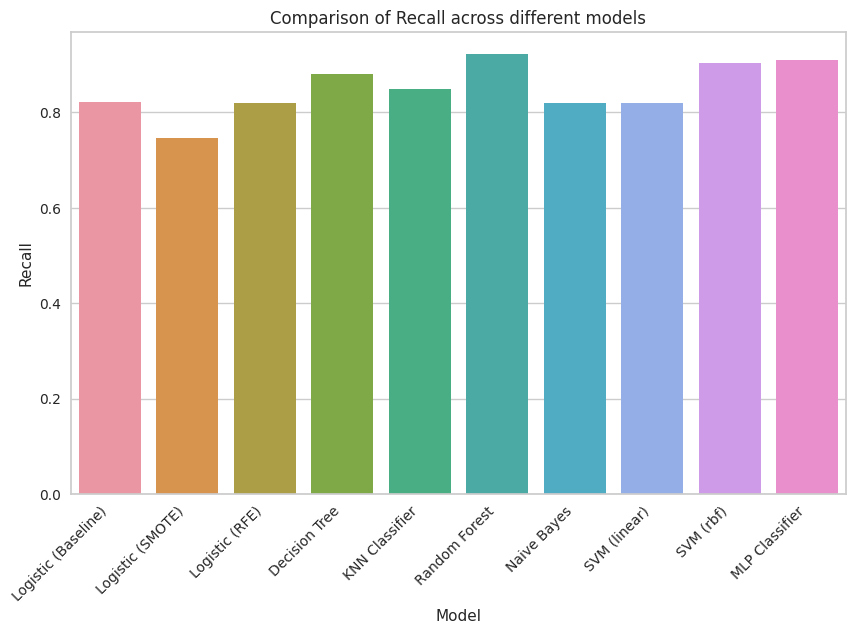

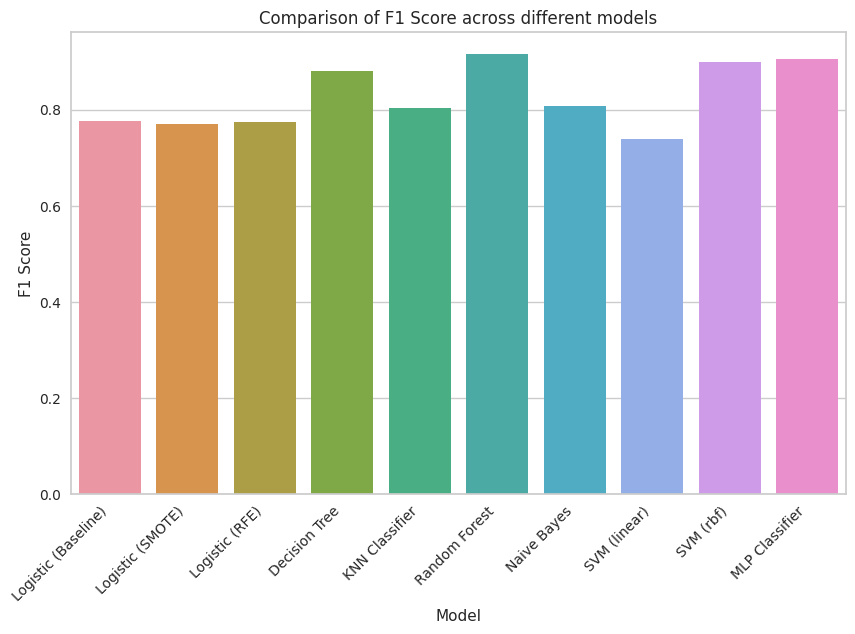

In [111]:
# Plotting the metrics
def plot_metrics(df, metric):
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Model', y=metric, data=df)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Comparison of {metric} across different models')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.show()

# Plot Accuracy
plot_metrics(model_performances_train, 'Accuracy')

# Plot Precision
plot_metrics(model_performances_train, 'Precision')

# Plot Recall
plot_metrics(model_performances_train, 'Recall')

# Plot F1 Score
plot_metrics(model_performances_train, 'F1 Score')

**5.3 Confusion Matrix**

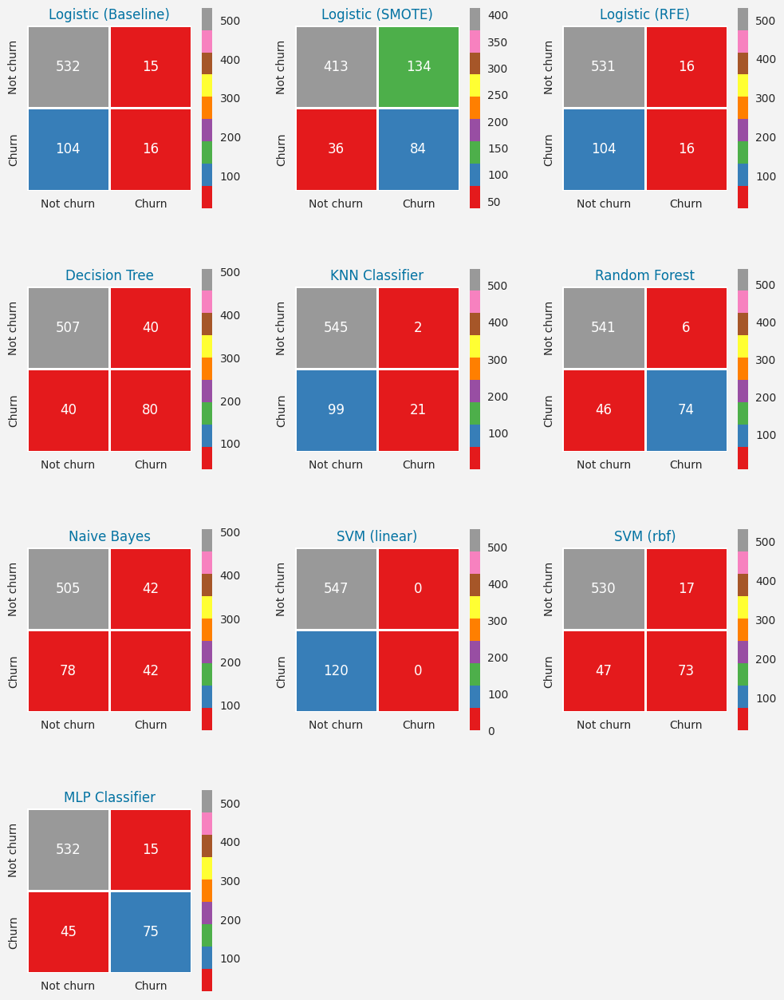

In [112]:


def confmatplot(modeldict, x_train, x_test, y_train, y_test, figcolnumber):
    fig = plt.figure(figsize=(4*figcolnumber, 4*ceil(len(modeldict)/figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        plt.subplot(ceil(len(modeldict)/figcolnumber), figcolnumber, figpos+1)
        if name == 'Logistic (SMOTE)':
            model = modeldict[name][0].fit(x_smote[modeldict[name][1]], y_smote)
            predictions = model.predict(x_test[modeldict[name][1]])
        else:
            model = modeldict[name][0].fit(x_train[modeldict[name][1]], y_train)
            predictions = model.predict(x_test[modeldict[name][1]])

        conf_matrix = confusion_matrix(y_test, predictions)
        sns.heatmap(conf_matrix, annot=True, fmt="d", square=True,
                    xticklabels=["Not churn", "Churn"],
                    yticklabels=["Not churn", "Churn"],
                    linewidths=2, linecolor="w", cmap="Set1")
        plt.title(name, color="b")
        plt.subplots_adjust(wspace=.3, hspace=.3)

    plt.show()

confmatplot(models, x_train, x_test, y_train, y_test, figcolnumber=3)


**5.4 Roc curves**

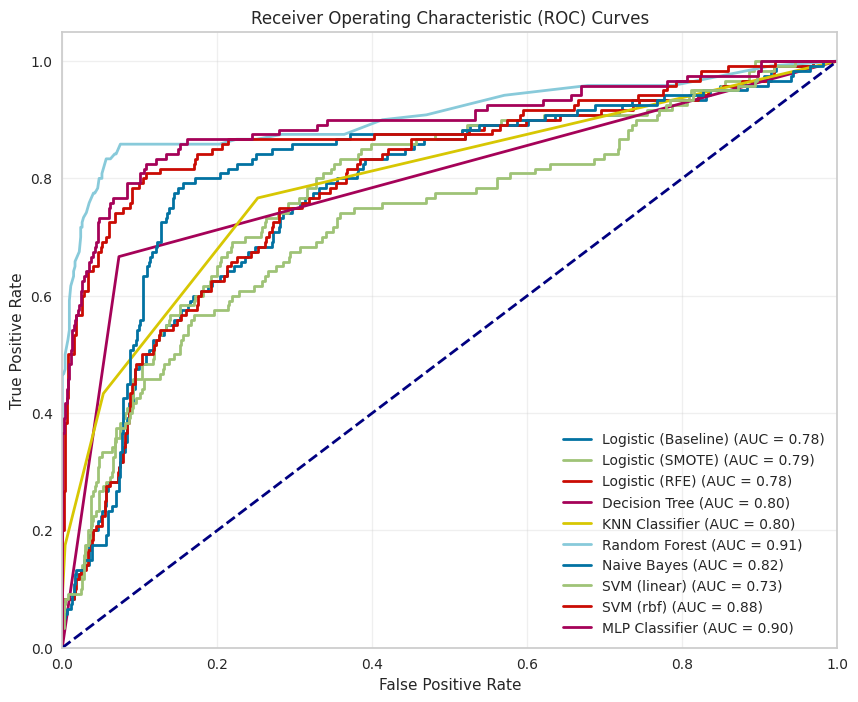

In [115]:


def plot_roc_curves(modeldict, x_train, x_test, y_train, y_test):
    plt.figure(figsize=(10, 8))
    for name, (model, cols) in modeldict.items():
        if name == 'Logistic (SMOTE)':
            model.fit(x_smote[cols], y_smote)
            y_prob = model.predict_proba(x_test[cols])[:, 1]
        else:
            model.fit(x_train[cols], y_train)
            y_prob = model.predict_proba(x_test[cols])[:, 1]
        
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        
        plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curves')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.show()

# Example usage of plot_roc_curves
# Assuming x_smote, y_smote, x_train, y_train, x_test, y_test, and models are defined
plot_roc_curves(models, x_train, x_test, y_train, y_test)


# 6.Model performances over the test dataset

**6.1.model performance metrics**

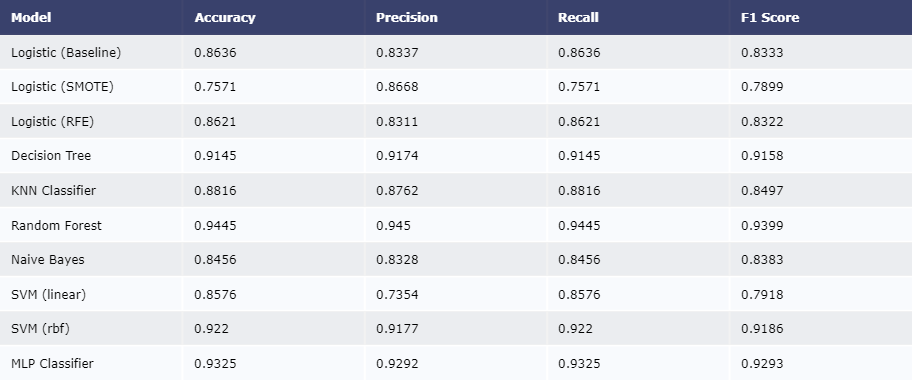

In [122]:
# Example usage
model_performances_test = []

for name in models:
    if name == 'Logistic (SMOTE)':
        report = model_report(models[name][0], 
                              x_smote[models[name][1]], 
                              telcom_test[models[name][1]], 
                              y_smote, 
                              telcom_test[target_col], 
                              name)
    else:
        report = model_report(models[name][0], 
                              x_train[models[name][1]], 
                              telcom_test[models[name][1]], 
                              y_train, 
                              telcom_test[target_col], 
                              name)
    model_performances_test.append(report)

# Concatenate all reports into a single DataFrame
model_performances_test = pd.concat(model_performances_test, ignore_index=True)

# Display the table
table_test = ff.create_table(np.round(model_performances_test, 4))
pio.show(table_test)

**6.2 compare model metrics**

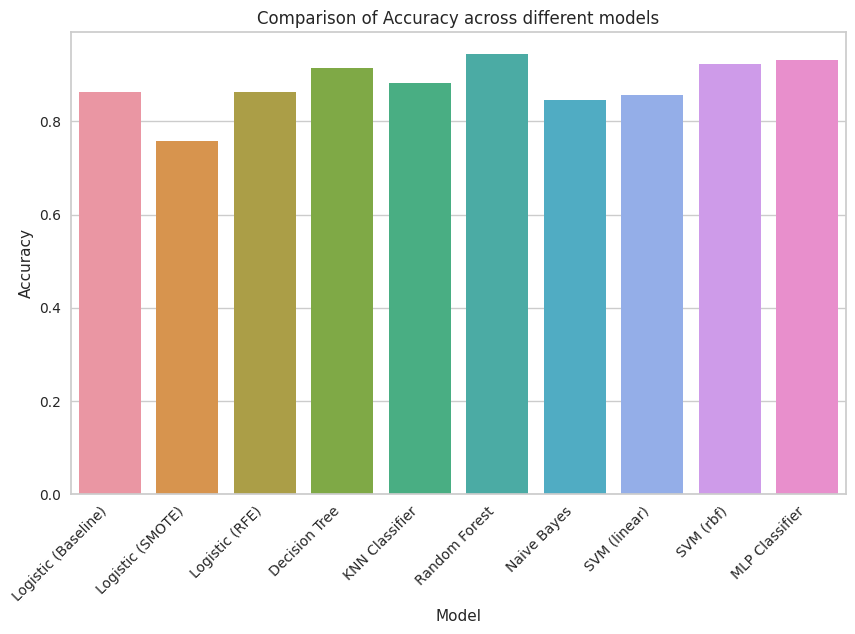

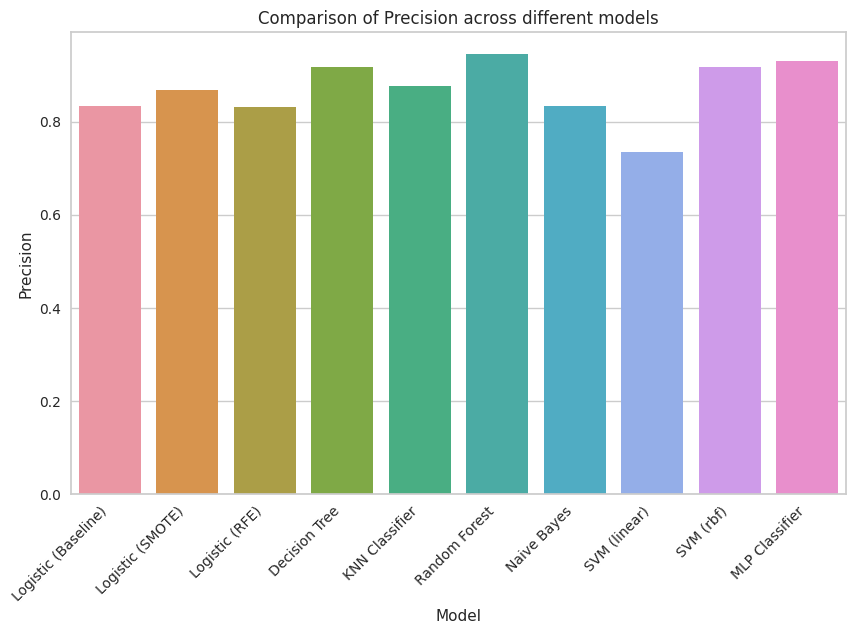

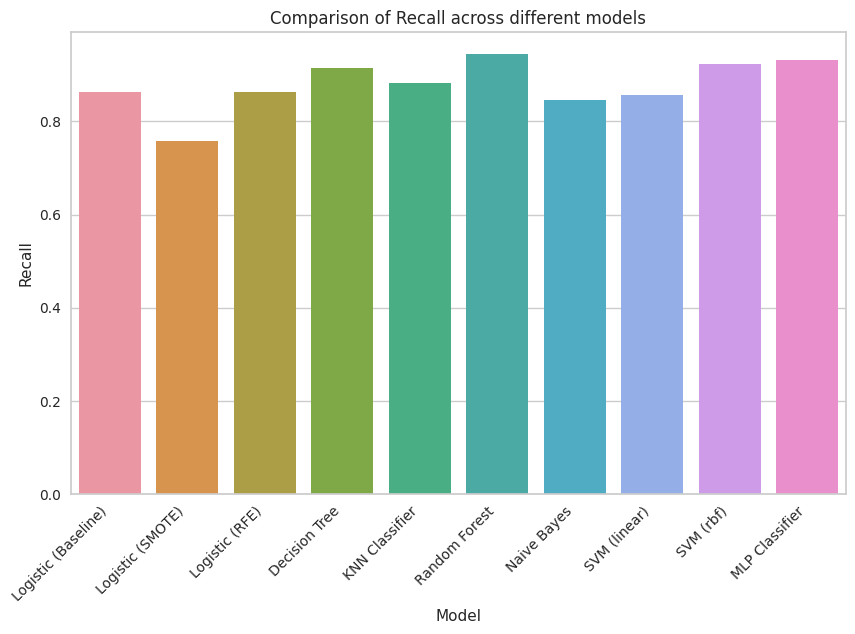

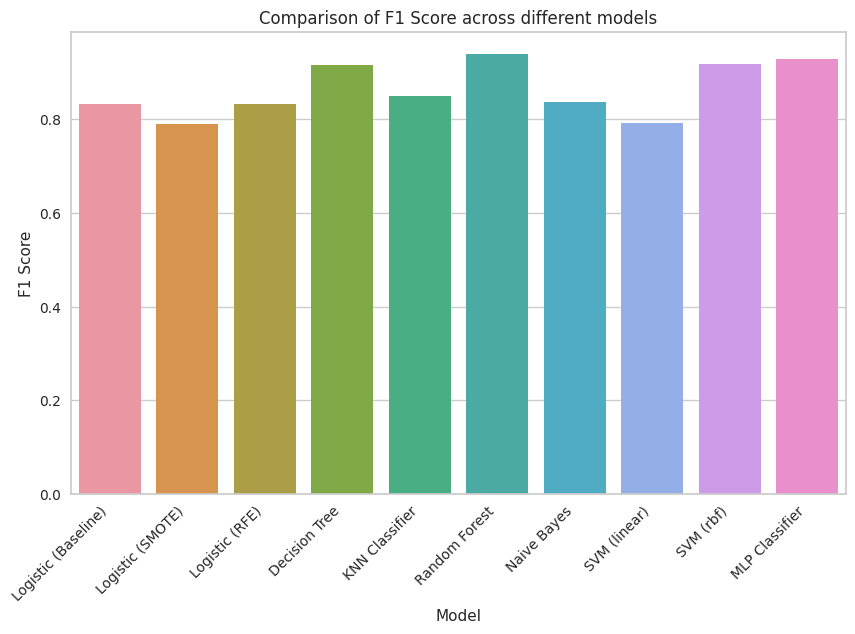

In [127]:
# Plotting the metrics
def plot_metrics(df, metric):
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Model', y=metric, data=df)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Comparison of {metric} across different models')
    plt.ylabel(metric)
    plt.xlabel('Model')
    plt.show()

# Plot Accuracy
plot_metrics(model_performances_test, 'Accuracy')

# Plot Precision
plot_metrics(model_performances_test, 'Precision')

# Plot Recall
plot_metrics(model_performances_test, 'Recall')

# Plot F1 Score
plot_metrics(model_performances_test, 'F1 Score')

**6.3 Confusion Matrix**

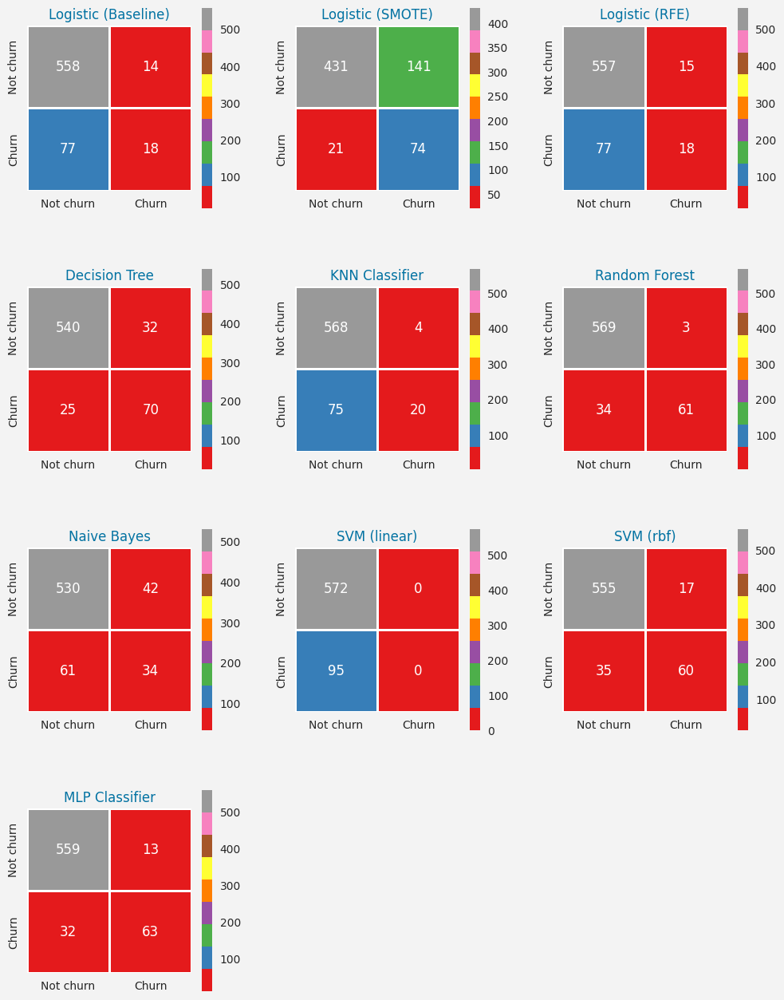

In [124]:


def confmatplot(modeldict, x_train, telcom_test, y_train, y_test, target_col, figcolnumber):
    fig = plt.figure(figsize=(4 * figcolnumber, 4 * ceil(len(modeldict) / figcolnumber)))
    fig.set_facecolor("#F3F3F3")
    for name, figpos in itertools.zip_longest(modeldict, range(len(modeldict))):
        plt.subplot(ceil(len(modeldict) / figcolnumber), figcolnumber, figpos + 1)
        if name == 'Logistic (SMOTE)':
            model = modeldict[name][0].fit(x_smote[modeldict[name][1]], y_smote)
            predictions = model.predict(telcom_test[modeldict[name][1]])
        else:
            model = modeldict[name][0].fit(x_train[modeldict[name][1]], y_train)
            predictions = model.predict(telcom_test[modeldict[name][1]])

        conf_matrix = confusion_matrix(telcom_test[target_col], predictions)
        sns.heatmap(conf_matrix, annot=True, fmt="d", square=True,
                    xticklabels=["Not churn", "Churn"],
                    yticklabels=["Not churn", "Churn"],
                    linewidths=2, linecolor="w", cmap="Set1")
        plt.title(name, color="b")
        plt.subplots_adjust(wspace=.3, hspace=.3)

    plt.show()

# Example usage of confmatplot
confmatplot(models, x_train, telcom_test, y_train, y_test, target_col, figcolnumber=3)


**6.4 Roc curves**

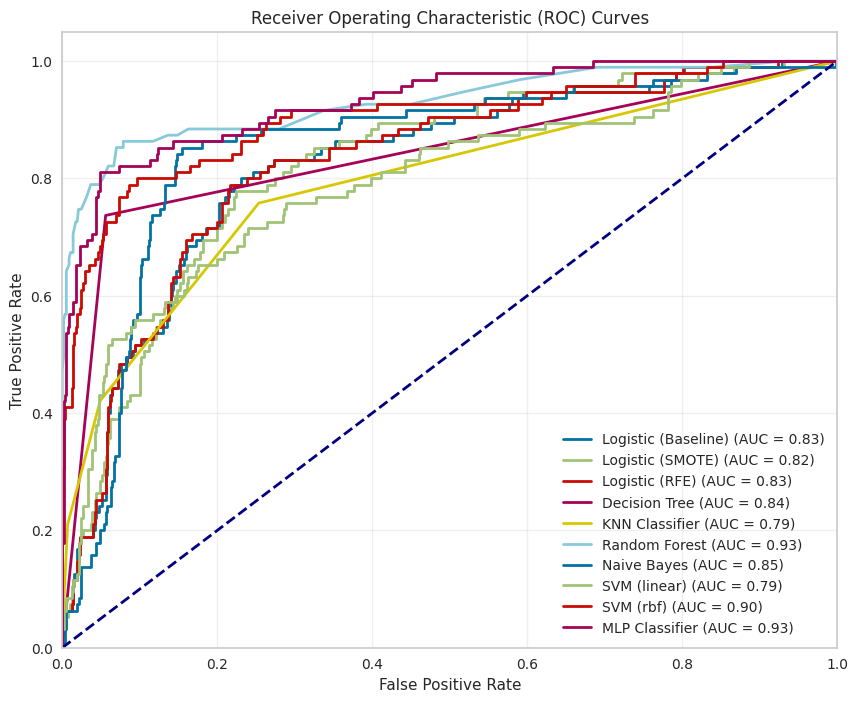

In [125]:


def plot_roc_curves(modeldict, x_train, telcom_test, y_train, y_test, target_col):
    plt.figure(figsize=(10, 8))
    for name, (model, cols) in modeldict.items():
        if name == 'Logistic (SMOTE)':
            model.fit(x_smote[cols], y_smote)
            y_prob = model.predict_proba(telcom_test[cols])[:, 1]
        else:
            model.fit(x_train[cols], y_train)
            y_prob = model.predict_proba(telcom_test[cols])[:, 1]

        fpr, tpr, _ = roc_curve(telcom_test[target_col], y_prob)
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curves')
    plt.legend(loc='lower right')
    plt.grid(alpha=0.3)
    plt.show()

# Example usage of plot_roc_curves
plot_roc_curves(models, x_train, telcom_test, y_train, y_test, target_col)
